# Globale Kindersterblichkeit und ihre Ursachen


### Fragestellungen:

- 1. Welche Länder wurden vom 2. Weltkrieg (1939-1945) am stärksten beeinflusst und was sind die Gründe?

- 2. Wie hängen Kindersterblichkeitsrate und Geburtenrate auf kontinentaler Ebene zusammen und wie verändert sich dieser Zusammenhang im Zeitverlauf?

- 3. Wie stark unterscheiden sich die Kindersterblichkeitsraten zwischen den Kontinenten und wie hat sich diese interkontinentale Ungleichheit im Laufe der Zeit verändert?

- 4. Wie stellt sich das in der Schweiz dar (Fragestellung 1 und 2)?


### Datenquellen:
- https://ourworldindata.org/grapher/child-mortality
- https://ourworldindata.org/grapher/children-born-per-woman?overlay=download-data

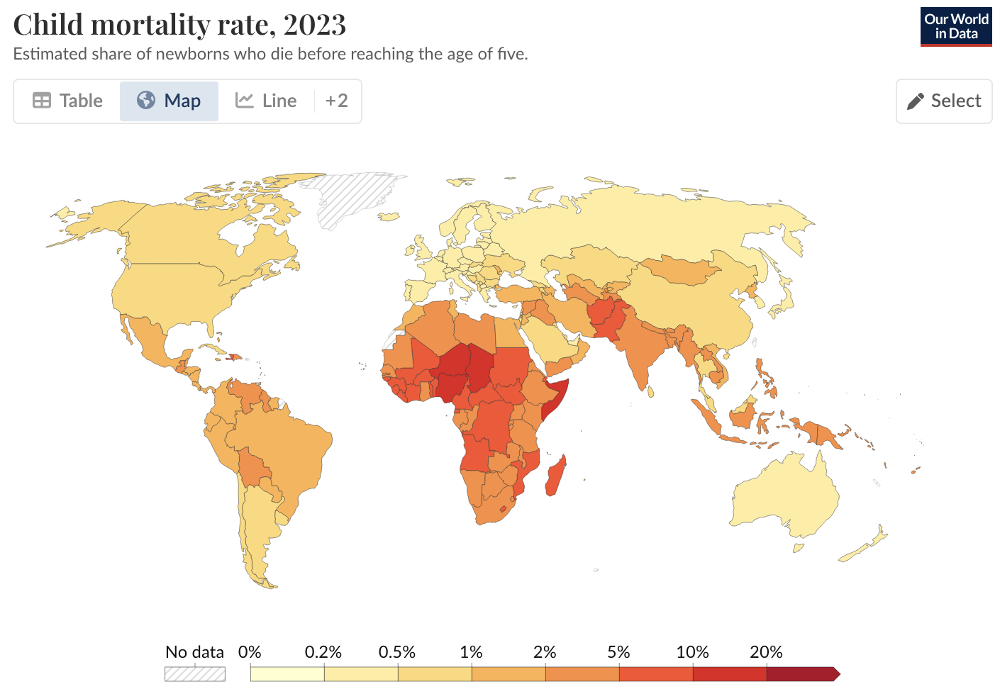

In [2]:
# Titelbild einfügen
from IPython.display import Image, display
bildpfad = "../resources/child mortality rate 2023.jpg"

display(Image(filename=bildpfad))


## 1. Daten beschaffen und laden

In [3]:
import pandas as pd

# CSV laden
df = pd.read_csv("../data/child-mortality.csv")

# Ersten Blick auf die Daten werfen
display(df.head())

# Datentypen und Nicht-Null-Werte
df.info()

# Spaltennamen anzeigen
print("Spaltennamen:")
print(df.columns.tolist())

# Fehlende Werte überprüfen
print("\nFehlende Werte:")
print(df.isna().sum())


,Entity,Code,Year,Child mortality rate
0,Afghanistan,AFG,1957,37.13
1,Afghanistan,AFG,1958,36.52
2,Afghanistan,AFG,1959,35.95
3,Afghanistan,AFG,1960,35.32
4,Afghanistan,AFG,1961,34.76


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16835 entries, 0 to 16834
Data columns (total 4 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Entity                16835 non-null  object 
 1   Code                  16217 non-null  object 
 2   Year                  16835 non-null  int64  
 3   Child mortality rate  16835 non-null  float64
dtypes: float64(1), int64(1), object(2)
memory usage: 526.2+ KB
Spaltennamen:
['Entity', 'Code', 'Year', 'Child mortality rate']

Fehlende Werte:
Entity                    0
Code                    618
Year                      0
Child mortality rate      0
dtype: int64


## 2. Daten bereinigen und vorbereiten
(Die Daten sind bereits im Long-Format)

In [4]:
# Spalten umbenennen
df.rename(columns={
    "Entity": "Land",
    "Code": "ISO",
    "Year": "Jahr",
    "Child mortality rate": "Kindersterblichkeit"
}, inplace=True)

# Jahr als Integer (zur Sicherheit)
df["Jahr"] = df["Jahr"].astype(int)

# Liste echter Kontinente laut OWID
echte_kontinente = [
    "Africa", "Asia", "Europe", "North America", "South America", "Oceania"
]

# Liste statistischer Regionen (wichtige Aggregationen in OWID)
statistische_regionen = [
    "World",
    "High-income countries",
    "Low-income countries",
    "Upper-middle-income countries",
    "Lower-middle-income countries",
    "Sub-Saharan Africa",
    "Middle East and North Africa",
    "Europe & Central Asia",
    "Latin America and the Caribbean",
    "East Asia and Pacific",
    "South Asia"
]

# Funktion zur sauberen Klassifizierung
def bestimme_ebene(row):
    if row["Land"] in echte_kontinente:
        return "Kontinent"
    elif row["Land"] in statistische_regionen:
        return "Region"
    elif pd.notna(row["ISO"]):
        return "Land"
    else:
        return "Unbekannt"

# Anwenden der Klassifizierung
df["Ebene"] = df.apply(bestimme_ebene, axis=1)


# Nach Ebene, Land, Jahr sortieren
df.sort_values(["Ebene", "Land", "Jahr"], inplace=True)
df.reset_index(drop=True, inplace=True)

# Vorschau
display(df.head())

# Kurze Übersicht
print(f"Gesamtzeilen: {len(df)}")
print(f"Anzahl Länder: {df[df['Ebene'] == 'Land']['Land'].nunique()}")
print(f"Kontinente/Regionen: {df[df['Ebene'] == 'Kontinent']['Land'].unique()}")


,Land,ISO,Jahr,Kindersterblichkeit,Ebene
0,Africa,NaN,1966,25.95,Kontinent
1,Africa,NaN,1967,25.34,Kontinent
2,Africa,NaN,1968,24.73,Kontinent
3,Africa,NaN,1969,24.39,Kontinent
4,Africa,NaN,1970,24.00,Kontinent


Gesamtzeilen: 16835
Anzahl Länder: 201
Kontinente/Regionen: ['Africa' 'Asia' 'Europe' 'North America' 'Oceania' 'South America']


## 3. Rohdatenanalyse

### 3.1 Pivottabelle

In [5]:
# Pivot-Tabelle: Land als Zeile, Jahr als Spalte, Kindersterblichkeit als Wert
pivot_df = df.pivot_table(
    index="Land",
    columns="Jahr",
    values="Kindersterblichkeit"
)

# Ergebnis anzeigen
pivot_df.head()


Jahr,1751,1752,1753,1754,1755,1756,1757,1758,1759,1760,...,2014,2015,2016,2017,2018,2019,2020,2021,2022,2023
Land,,,,,,,,,,,,,,,,,,,,,
Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7.51,7.24,7.00,6.76,6.54,6.33,6.13,5.93,5.74,5.55
Africa,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,7.68,7.49,7.31,7.17,6.83,6.66,6.43,6.27,6.22,5.91
Albania,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.99,0.96,0.94,0.93,0.93,0.94,0.94,0.95,0.94,0.94
Algeria,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,2.54,2.49,2.45,2.40,2.37,2.33,2.29,2.26,2.23,2.20
Andorra,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.37,0.35,0.34,0.32,0.31,0.30,0.29,0.28,0.27,0.26


#### Diese Pivot-Tabelle zeigt die Kindersterblichkeit für alle Länder auf Basis der verfügbaren Daten von Our World in Data.

### 3.2 Pivottabelle mit Heatmap 

In [6]:
%pip install jinja2


Note: you may need to restart the kernel to use updated packages.


<span style="color:#1f77b4;">
Die Pivottabelle ist im Jupyter Notebook farblich gekennzeichnet. 
Es gehört zur visuellen Darstellung der Rohdatenanalyse. Im Jupyternotebook kann gescrollt werden und man sieht die Heatmap. Hohe Sterbilichkeitsraten sind rot eingefärbt. 
</span>

In [7]:
from IPython.display import display, HTML

# Pivot-Tabelle: Länder als Zeilen, Jahre als Spalten
pivot_df = df.pivot_table(
    index="Land",
    columns="Jahr",
    values="Kindersterblichkeit"
).round(1)

# Heatmap
styled = pivot_df.style.background_gradient(
    cmap='OrRd',    # Orange-Rot-Farbverlauf
    axis=None
).format("{:.1f}")

# HTML-Rendern
styled_html = styled.to_html()

# CSS für scrollbaren Container
scroll_style = """
<style>
.scroll-wrapper {
    max-height: 400px;
    overflow: auto;
    border: 1px solid #ccc;
    font-family: sans-serif;
    font-size: 13px;
}
</style>
"""

display(HTML(scroll_style + f'<div class="scroll-wrapper">{styled_html}</div>'))


#### Heatmap-Pivot-Tabelle zur Kindersterblichkeit nach Ländern; um höhere Werte besser hevorstechen zu lassen.

### 3.3 Rohdatenanalyse

1. Wie viele Länder sind enthalten?

In [8]:
anzahl_laender = df[df["Ebene"] == "Land"]["Land"].nunique()
print(f"Anzahl Länder im Datensatz: {anzahl_laender}")


Anzahl Länder im Datensatz: 201


2. Welche Kontinente sind enthalten?

In [9]:
# Echte Kontinente definieren
echte_kontinente = [
    "Africa",
    "Asia",
    "Europe",
    "North America",
    "Oceania",
    "South America"
]

In [10]:
# Kontinente filtern
kontinente = [k for k in echte_kontinente if k in df["Land"].unique()]
print("\nKontinente im Datensatz:")
for k in kontinente:
    print("•", k)

print("\nAnzahl Kontinente:", len(kontinente))



Kontinente im Datensatz:
• Africa
• Asia
• Europe
• North America
• Oceania
• South America

Anzahl Kontinente: 6


### 3.4 Datenspanne

1. Zwischen welchen Jahren sind Daten enthalten?

In [11]:
min_jahr = df["Jahr"].min()
max_jahr = df["Jahr"].max()

print(f"Der Datensatz enthält Werte von {min_jahr} bis {max_jahr}.")


Der Datensatz enthält Werte von 1751 bis 2023.


2. Zwischen welchen Jahren sind Daten für alle Länder enthalten?

In [12]:
# Nur Länder
df_länder = df[df["Ebene"] == "Land"]

# Pivot: Länder = Zeilen, Jahre = Spalten
pivot_länder = df_länder.pivot_table(
    index="Land",
    columns="Jahr",
    values="Kindersterblichkeit"
)

# Zähle pro Jahr, wie viele Länder gültige Werte haben
anzahl_daten_pro_jahr = pivot_länder.notna().sum(axis=0)

# Gesamtanzahl Länder
anzahl_länder = pivot_länder.shape[0]

# Jahre, in denen ALLE Länder Daten haben
vollständige_jahre = anzahl_daten_pro_jahr[anzahl_daten_pro_jahr == anzahl_länder]

if not vollständige_jahre.empty:
    erstes_jahr = vollständige_jahre.index.min()
    print(f"Alle Länder haben ab dem Jahr {erstes_jahr} vollständige Daten.")
else:
    print("Es gibt kein Jahr, in dem alle Länder gleichzeitig Daten haben.")


Alle Länder haben ab dem Jahr 1985 vollständige Daten.


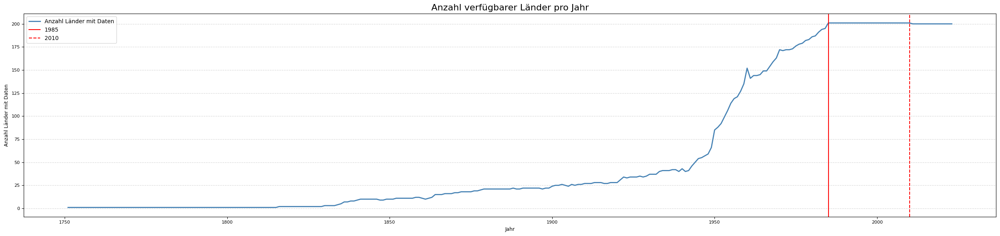

In [13]:
import matplotlib.pyplot as plt


# Nur Länder mit gültigen Werten
df_länder = df[(df["Ebene"] == "Land") & (df["Kindersterblichkeit"].notna())]

# Zähle: wie viele Länder haben pro Jahr Daten?
datenpunkte_pro_jahr = df_länder.groupby("Jahr")["Land"].nunique()

# Plot-Konfiguration (wie bei deinen bisherigen Balkendiagrammen)
figsize = (25, 6)
fontsize_title = 16
fontsize_labels = 9
fontsize_ticks = 8

# Plot
plt.figure(figsize=figsize)
plt.plot(
    datenpunkte_pro_jahr.index,
    datenpunkte_pro_jahr.values,
    color="steelblue",
    linewidth=2,
    label="Anzahl Länder mit Daten"
)

plt.axvline(x=1985, color="red", linestyle="-", label="1985")
plt.axvline(x=2010, color="red", linestyle="--", label="2010")

plt.title("Anzahl verfügbarer Länder pro Jahr", fontsize=fontsize_title)
plt.xlabel("Jahr", fontsize=fontsize_labels)
plt.ylabel("Anzahl Länder mit Daten", fontsize=fontsize_labels)
plt.xticks(fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)

plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()



#### Die obige Darstellung stellt grafisch die Datenspanne dar. 

### 4. Zwischen welchen Jahren sind Daten für alle Kontinente und statistischen Zonen verfügbar?

In [14]:
# Hilfslisten zur Abgrenzung
echte_kontinente = [
    "Africa", "Asia", "Europe", "North America", "South America", "Oceania"
]

# Alle Namen mit fehlendem ISO (sind keine Länder)
df_nicht_länder = df[df["ISO"].isna()]

# 1. Kontinente
df_kontinente = df[df["Land"].isin(echte_kontinente)]
min_jahr_kontinente = df_kontinente["Jahr"].min()
max_jahr_kontinente = df_kontinente["Jahr"].max()

# 2. Regionen (nicht Land, nicht Kontinent)
regionen = df_nicht_länder[~df_nicht_länder["Land"].isin(echte_kontinente)]
min_jahr_regionen = regionen["Jahr"].min()
max_jahr_regionen = regionen["Jahr"].max()

print(f"Kontinente: Daten von {min_jahr_kontinente} bis {max_jahr_kontinente}")
print(f"Statistische Regionen: Daten von {min_jahr_regionen} bis {max_jahr_regionen}")


Kontinente: Daten von 1949 bis 2023
Statistische Regionen: Daten von 1968 bis 2023


### 5. Welches Land hat die meisten und welches die wenigsten Datenpunkte?

In [15]:
# Nur Länder analysieren
df_länder = df[df["Ebene"] == "Land"]

# Zähle Anzahl gültiger Werte pro Land
datenpunkte_pro_land = df_länder.groupby("Land")["Kindersterblichkeit"].apply(lambda x: x.notna().sum())

# Land mit meisten Datenpunkten
land_max = datenpunkte_pro_land.idxmax()
anz_max = datenpunkte_pro_land.max()

# Land mit wenigsten Datenpunkten (>0)
datenpunkte_positiv = datenpunkte_pro_land[datenpunkte_pro_land > 0]
land_min = datenpunkte_positiv.idxmin()
anz_min = datenpunkte_positiv.min()

print(f"📈 Land mit den meisten Datenpunkten: {land_max} ({anz_max} Jahre)")
print(f"📉 Land mit den wenigsten Datenpunkten: {land_min} ({anz_min} Jahre)")


📈 Land mit den meisten Datenpunkten: Sweden (273 Jahre)
📉 Land mit den wenigsten Datenpunkten: Andorra (39 Jahre)


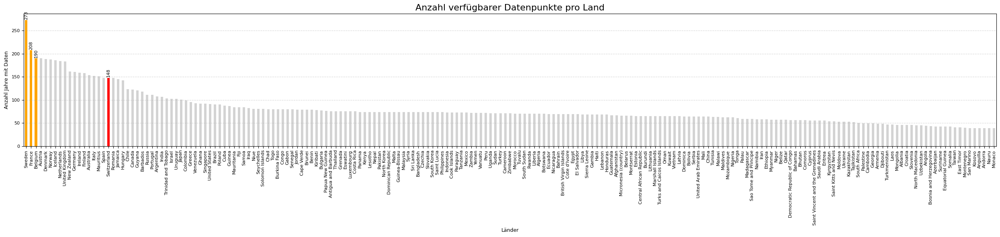

In [16]:
# Basisdaten: Länder mit Anzahl gültiger Werte
df_länder = df[df["Ebene"] == "Land"]
datenpunkte = df_länder.groupby("Land")["Kindersterblichkeit"].apply(lambda x: x.notna().sum())
datenpunkte = datenpunkte.sort_values(ascending=False)

# Konfiguration
figsize = (25, 6)
bar_width = 0.5
fontsize_title = 16
fontsize_labels = 9
fontsize_ticks = 8  # Wird auch für Balkenbeschriftung verwendet

farbe_standard = "lightgrey"
farbe_top3 = "orange"
farbe_schweiz = "red"

# Farben zuweisen
farben = [farbe_standard] * len(datenpunkte)
top3 = datenpunkte.head(3).index

for i, land in enumerate(datenpunkte.index):
    if land in top3:
        farben[i] = farbe_top3
    elif land == "Switzerland":
        farben[i] = farbe_schweiz

# Plot
plt.figure(figsize=figsize)
bars = plt.bar(datenpunkte.index, datenpunkte.values, color=farben, width=bar_width)

plt.xlim(-0.5, len(datenpunkte) - 0.5)
plt.title("Anzahl verfügbarer Datenpunkte pro Land", fontsize=fontsize_title)
plt.ylabel("Anzahl Jahre mit Daten", fontsize=fontsize_labels)
plt.xlabel("Länder", fontsize=fontsize_labels)

plt.xticks(rotation=90, fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Werte über den Top 3 + Schweiz anzeigen (rot/orange Balken)
for i, bar in enumerate(bars):
    land = datenpunkte.index[i]
    wert = datenpunkte.iloc[i]
    
    if land in top3 or land == "Switzerland":
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 1,  # etwas oberhalb des Balkens
            str(wert),
            ha='center',
            va='bottom',
            fontsize=fontsize_ticks,
            rotation=90,
            color='black'
        )

plt.tight_layout()
plt.show()


#### Anzahl verfügbare Datensätze pro Land grafisch dargestellt. Orange hervorgehoben sind die 3 Länder mit den meisten Datenpunkten, und rot die Schweiz. 

### 6. Durchschnittliche Kindersterblichkeit

Der Durchschnitt des gesamten Datenzeitraumes eines Landes in einer Liste dargestellt

In [17]:
# Schritt 1: Dictionary mit Listen der Werte pro Land erstellen
werte_pro_land = {}

for _, zeile in df.iterrows():
    if zeile["Ebene"] == "Land":
        land = zeile["Land"]
        wert = zeile["Kindersterblichkeit"]
        if not pd.isna(wert):
            if land not in werte_pro_land:
                werte_pro_land[land] = []
            werte_pro_land[land].append(wert)

# Schritt 2: Durchschnitt berechnen
durchschnitt_pro_land = {}

for land, werte in werte_pro_land.items():
    durchschnitt = round(sum(werte) / len(werte), 1)
    durchschnitt_pro_land[land] = durchschnitt

# Schritt 3: Ausgabe als sortierte Texttabelle
print(f"{'Land':30} | {'Durchschnitt'}")
print("-" * 45)

for land in sorted(durchschnitt_pro_land, key=durchschnitt_pro_land.get):
    print(f"{land:30} | {durchschnitt_pro_land[land]}")


Land                           | Durchschnitt
---------------------------------------------
Monaco                         | 0.5
San Marino                     | 0.6
Andorra                        | 0.7
Slovenia                       | 0.8
Montenegro                     | 1.1
Anguilla                       | 1.2
Croatia                        | 1.2
Taiwan                         | 1.2
Cyprus                         | 1.3
Czechia                        | 1.6
Belarus                        | 1.7
Estonia                        | 1.7
Lithuania                      | 1.7
Luxembourg                     | 1.7
Latvia                         | 1.8
Ukraine                        | 1.8
Bosnia and Herzegovina         | 1.9
Bahamas                        | 2.1
Malta                          | 2.2
Slovakia                       | 2.4
United States                  | 2.4
Qatar                          | 2.5
Tonga                          | 2.6
North Macedonia                | 2.8
Albania             

### Grafische Darstellung der durchschnittlichen Kindersterblichkeit

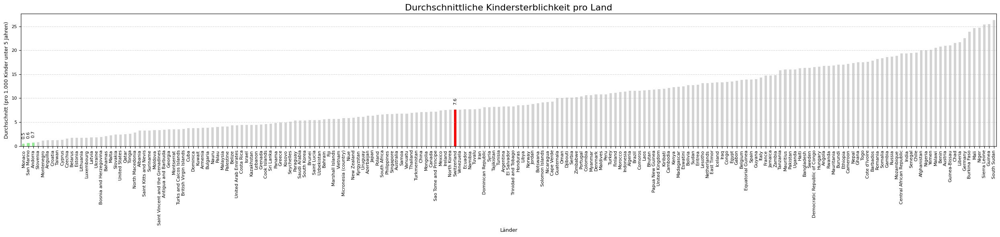

In [18]:
# Dictionary sortieren (aufsteigend nach Durchschnitt)
sorted_items = sorted(durchschnitt_pro_land.items(), key=lambda item: item[1])
länder = [item[0] for item in sorted_items]
werte = [item[1] for item in sorted_items]

# Konfiguration
figsize = (25, 6)
bar_width = 0.5
fontsize_title = 16
fontsize_labels = 9
fontsize_ticks = 8

farbe_standard = "lightgrey"
farbe_top3 = "lightgreen"
farbe_schweiz = "red"

# Farben zuweisen
farben = [farbe_standard] * len(länder)
top3 = länder[:3]  # Niedrigste Sterblichkeit = beste Länder

for i, land in enumerate(länder):
    if land in top3:
        farben[i] = farbe_top3
    elif land == "Switzerland":
        farben[i] = farbe_schweiz

# Plot
plt.figure(figsize=figsize)
bars = plt.bar(länder, werte, color=farben, width=bar_width)

plt.xlim(-0.5, len(länder) - 0.5)
plt.title("Durchschnittliche Kindersterblichkeit pro Land", fontsize=fontsize_title)
plt.ylabel("Durchschnitt (pro 1.000 Kinder unter 5 Jahren)", fontsize=fontsize_labels)
plt.xlabel("Länder", fontsize=fontsize_labels)

plt.xticks(rotation=90, fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)
plt.grid(axis='y', linestyle='--', alpha=0.5)

# Werte über den Top 3 + Schweiz anzeigen (rot/orange Balken)
for i, bar in enumerate(bars):
    land = länder[i]
    wert = werte[i]
    
    if land in top3 or land == "Switzerland":
        plt.text(
            bar.get_x() + bar.get_width() / 2,
            bar.get_height() + 1,
            str(wert),
            ha='center',
            va='bottom',
            fontsize=fontsize_ticks,
            rotation=90,
            color='black'
        )

plt.tight_layout()
plt.show()


#### Die durchschnittliche Kindersterblichkeit  der Schweiz ist rot markiert.

### 7. Verteilung der Kindersterblichkeit über die Jahre

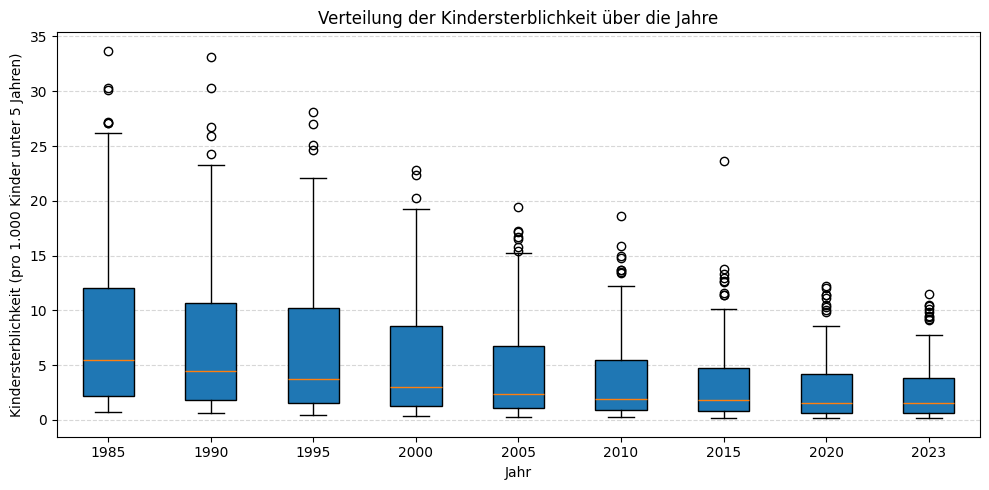

In [19]:
# Jahre auswählen
jahre = [1985, 1990, 1995, 2000, 2005, 2010, 2015, 2020, 2023]

# Nur Länder
df_länder = df[df["Ebene"] == "Land"]

# Listen vorbereiten
boxplot_daten = []  # Liste von Listen

for jahr in jahre:
    werte_liste = (
        df_länder[df_länder["Jahr"] == jahr]["Kindersterblichkeit"]
        .dropna()
        .tolist()
    )
    boxplot_daten.append(werte_liste)

# Boxplot
plt.figure(figsize=(10, 5))
plt.boxplot(
    boxplot_daten,
    tick_labels=jahre,   # neuer Parametername (statt labels)
    patch_artist=True
)

plt.title("Verteilung der Kindersterblichkeit über die Jahre")
plt.xlabel("Jahr")
plt.ylabel("Kindersterblichkeit (pro 1.000 Kinder unter 5 Jahren)")
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


#### Die Grafik zeigt die zeitliche Entwicklung und Streuung der Kindersterblichkeit über mehrere Jahre anhand von Boxplots.

### Grafische Darstellung der jährlichen Veränderung der Kindersterblichkeit (Durchschnitt)



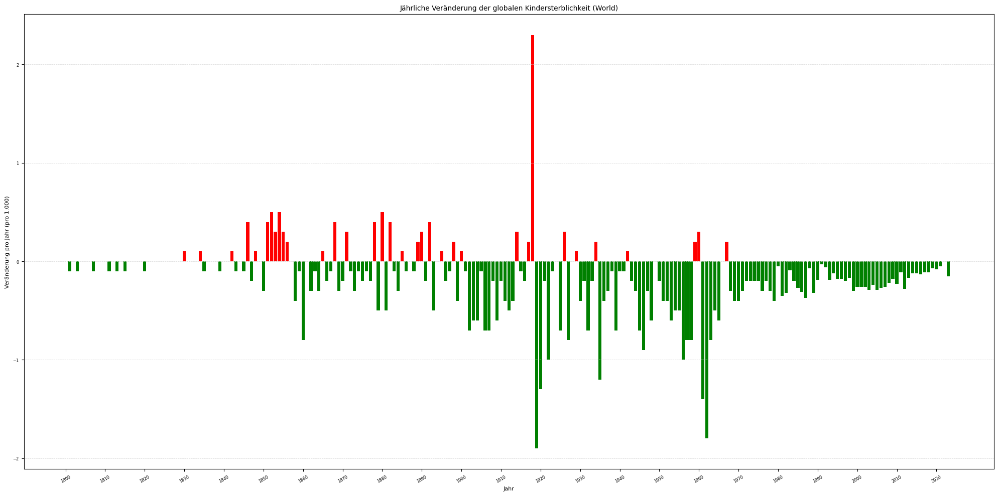

In [20]:
# Filter: Region "World"
df_world = df[
    (df["Land"] == "World") &
    (df["Ebene"] == "Region")
].sort_values("Jahr").copy()

# Jahr-zu-Jahr-Veränderung
df_world["Δ Kindersterblichkeit"] = df_world["Kindersterblichkeit"].diff()

# Farben: Rückgang grün, Anstieg rot
farben = df_world["Δ Kindersterblichkeit"].apply(
    lambda x: "green" if x < 0 else "red"
)

# Plot
plt.figure(figsize=(20, 10))
plt.bar(
    df_world["Jahr"],
    df_world["Δ Kindersterblichkeit"],
    color=farben
)

# Titel und Achsenbeschriftung
plt.title("Jährliche Veränderung der globalen Kindersterblichkeit (World)", fontsize=10)
plt.xlabel("Jahr", fontsize=8)
plt.ylabel("Veränderung pro Jahr (pro 1.000)", fontsize=8)

# Achsenticks
plt.xticks(
    ticks=df_world["Jahr"][::10],
    rotation=30,
    fontsize=6
)
plt.yticks(fontsize=6)

# Gitterlinien
plt.grid(axis="y", color="lightgrey", linestyle="--", linewidth=0.5)

# Layout
plt.tight_layout()
plt.show()


#### Das Balkendiagramm zeigt die jährliche Veränderung der Kindersterblichkeit (pro 1000 Kinder unter 5 Jahren); negative Werte (grün) stehen für Rückgänge, positive Werte (rot) für Anstiege.

## Historischer Ausschlag 1919 – Ursache: Spanische Grippe

Der auffällige Anstieg der globalen Kindersterblichkeit im Jahr **1919** ist historisch erklärbar: In dieser Zeit wütete die sogenannte **Spanische Grippe** (1918–1919), eine der tödlichsten Pandemien der modernen Geschichte.

Wie in der unteren Grafik ersichtlich ist kommt der Name **„Spanische Grippe“** nicht daher, dass die Grippe in Spanien ausbrach, sondern da Spanien als neutrales Land im Ersten Weltkrieg offen über die Seuche berichtete, während andere kriegführende Staaten Informationen zensierten. Dadurch wirkten die ersten bekannten Berichte so, als sei Spanien besonders betroffen, obwohl sich die Pandemie weltweit ausbreitete.

Die Pandemie forderte weltweit geschätzte **50 bis 100 Millionen Todesopfer** – darunter auch viele Kinder. Die Ausbreitung fiel unmittelbar in die Nachkriegszeit des Ersten Weltkriegs, was die Situation zusätzlich verschärfte: 

- schlechte Ernährungslage
- schwache Gesundheitsinfrastruktur
- weltweit hohe Mobilität (Truppenbewegungen, Migration)
- schlechte Hygiene und kaum medizinische Gegenmaßnahmen

Die Daten aus dem Datensatz von *Our World in Data* (OWID) bestätigen diesen historischen Bruch: **1919** zeigt den stärksten Anstieg der Kindersterblichkeit im gesamten Zeitverlauf.

 **Quelle:**  
- Our World in Data: [https://ourworldindata.org/child-mortality](https://ourworldindata.org/child-mortality)  
- Taubenberger, J. K., & Morens, D. M. (2006). 1918 Influenza: the mother of all pandemics. *Emerging Infectious Diseases*, 12(1), 15–22.  
- WHO: [https://www.who.int/news-room/spotlight/100-years-of-influenza-pandemic-legacy](https://www.who.int/news-room/spotlight/100-years-of-influenza-pandemic-legacy)
- Wikipedia: https://de.wikipedia.org/wiki/Spanische_Grippe


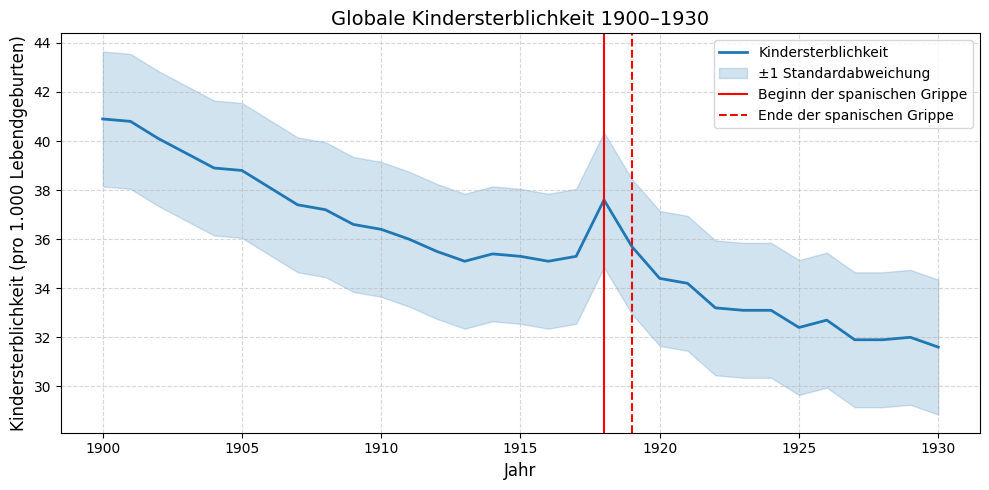

In [21]:
# Filter: Weltweite Kindersterblichkeit zwischen 1900 und 1930
df_world_zeit = df[
    (df["Land"] == "World") & 
    (df["Jahr"].between(1900, 1930))
].copy()

# Kindersterblichkeit
jahre = df_world_zeit["Jahr"]
werte = df_world_zeit["Kindersterblichkeit"]

# Standardabweichung berechnen
std = werte.std()

# Plot
plt.figure(figsize=(10, 5))

# Kindersterblichkeit als Linie
plt.plot(jahre, werte, color="#1f77b4", linewidth=2, label="Kindersterblichkeit")

# Fläche für ±1 Standardabweichung
plt.fill_between(
    jahre,
    werte - std,
    werte + std,
    color="#1f77b4",
    alpha=0.2,
    label="±1 Standardabweichung"
)

# Spanische Grippe markieren
plt.axvline(1918, color="red", linestyle="-", linewidth=1.5, label="Beginn der spanischen Grippe")
plt.axvline(1919, color="red", linestyle="--", linewidth=1.5, label="Ende der spanischen Grippe")

# Achsen & Layout
plt.title("Globale Kindersterblichkeit 1900–1930", fontsize=14)
plt.xlabel("Jahr", fontsize=12)
plt.ylabel("Kindersterblichkeit (pro 1.000 Lebendgeburten)", fontsize=12)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


#### Globale Kindersterblichkeit von 1900 bis 1930 (pro 1.000 Lebendgeburten). Die Linie zeigt den Mittelwert, die Schattierung ±1 Standardabweichung; der Zeitraum der Spanischen Grippe ist markiert. Hier wird der starke globale Anstieg der Kindersterblichkeit gut sichtbar.

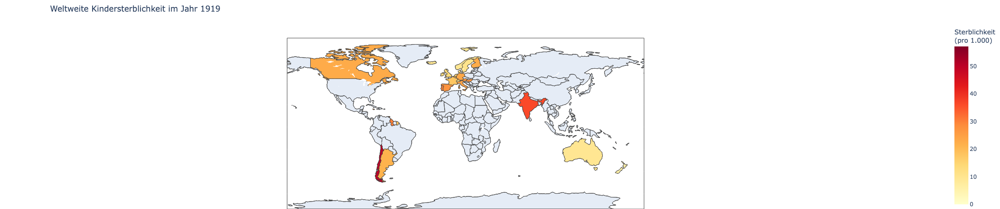

#### Heatmap der globalen Kndersterblichkeit im Jahr 1919.

## 4. Analyse
### 4.1. Datenaufbereitung für 1. Fragestellung: Welche Länder wurden vom 2. Weltkrieg (1939-1945) am stärksten beeinflusst und was sind die Gründe?

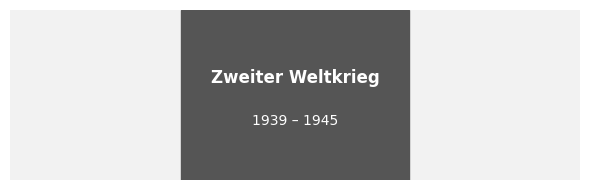

In [22]:
from matplotlib.patches import Rectangle

fig, ax = plt.subplots(figsize=(6, 2))

# Hintergrund (hell)
ax.add_patch(Rectangle((0, 0), 10, 2, color="#f2f2f2"))

# Dunkler Zeitraum (Symbol für Krieg)
ax.add_patch(Rectangle((3, 0), 4, 2, color="#555555"))

# Beschriftung
ax.text(5, 1.2, "Zweiter Weltkrieg", ha="center", va="center",
        fontsize=12, color="white", weight="bold")
ax.text(5, 0.7, "1939 – 1945", ha="center", va="center",
        fontsize=10, color="white")

# Achsen ausblenden
ax.set_xlim(0, 10)
ax.set_ylim(0, 2)
ax.axis("off")

plt.tight_layout()

plt.show()


Für die Analyse werden die **direkt** vom Krieg betroffenen Länder definiert. 

In [23]:
kriegslaender = [
    "Germany",
    "Poland",
    "France",
    "United Kingdom",
    "Italy",
    "Austria",
    "Hungary",
    "Netherlands",
    "Belgium",
    "Greece",
    "Yugoslavia",
    "Czechoslovakia",
    "Finland",
    "Norway",
    "Denmark",
    "Japan",
    "China",
    "Philippines",
    "Russia"
]



Liste nicht vollständig wichtigste Länder zusammengefasst

Quelle: https://de.wikipedia.org/wiki/Kriegf%C3%BChrende_Staaten_im_Zweiten_Weltkrieg

Definierte Ländern durchsuchen nach Datenverfügbarkeit. Dies da laut Ourworld in Data die Daten nicht vollständig sind für manche länder: 

In [24]:
# Zeitraum definieren
zeitraum_start = 1939
zeitraum_ende = 1945

# Ergebnislisten
laender_mit_daten = []
laender_ohne_daten = []

# Analyse durchführen
for land in kriegslaender:
    df_land = df[
        (df["Land"] == land) &
        (df["Ebene"] == "Land") &
        (df["Jahr"] >= zeitraum_start) &
        (df["Jahr"] <= zeitraum_ende) &
        (df["Kindersterblichkeit"].notna())
    ]
    
    if not df_land.empty:
        laender_mit_daten.append(land)
    else:
        laender_ohne_daten.append(land)

# Ausgabe
print(f"✅ Länder mit Daten von {zeitraum_start}–{zeitraum_ende}:")
for l in laender_mit_daten:
    print("•", l)

print(f"\n❌ Länder ohne Daten von {zeitraum_start}–{zeitraum_ende}:")
for l in laender_ohne_daten:
    print("•", l)


✅ Länder mit Daten von 1939–1945:
• Germany
• France
• United Kingdom
• Italy
• Austria
• Hungary
• Netherlands
• Belgium
• Greece
• Finland
• Norway
• Denmark
• Japan

❌ Länder ohne Daten von 1939–1945:
• Poland
• Yugoslavia
• Czechoslovakia
• China
• Philippines
• Russia


Liste neu definieren:

In [25]:
# Zeitspanne
zeitraum_start = 1939
zeitraum_ende = 1945

# Neue Liste: nur Länder mit Daten in diesem Zeitraum
kriegslaender_mit_daten = []

for land in kriegslaender:
    df_land = df[
        (df["Land"] == land) &
        (df["Ebene"] == "Land") &
        (df["Jahr"] >= zeitraum_start) &
        (df["Jahr"] <= zeitraum_ende) &
        (df["Kindersterblichkeit"].notna())
    ]
    
    if not df_land.empty:
        kriegslaender_mit_daten.append(land)

# Ausgabe der neuen Liste
print("Neue Liste: Länder mit Daten von 1939–1945:")
print(kriegslaender_mit_daten)


Neue Liste: Länder mit Daten von 1939–1945:
['Germany', 'France', 'United Kingdom', 'Italy', 'Austria', 'Hungary', 'Netherlands', 'Belgium', 'Greece', 'Finland', 'Norway', 'Denmark', 'Japan']


### Visualisierung der Datenpunkte


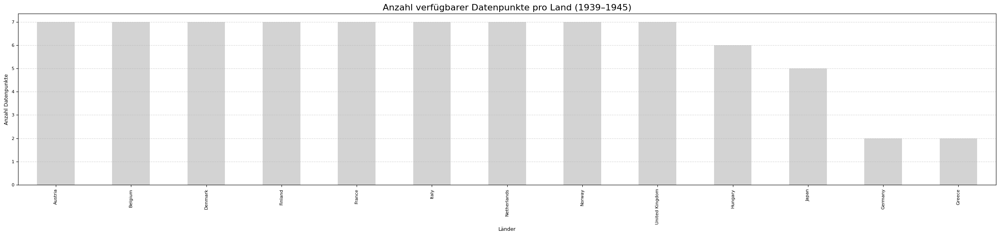

In [26]:
# Zeitraum
zeitraum_start = 1939
zeitraum_ende = 1945

# Nur Länder aus der geprüften Liste mit echten Daten
df_zeit = df[
    (df["Ebene"] == "Land") &
    (df["Land"].isin(kriegslaender_mit_daten)) &
    (df["Jahr"] >= zeitraum_start) &
    (df["Jahr"] <= zeitraum_ende) &
    (df["Kindersterblichkeit"].notna())
]

# Anzahl Datenpunkte pro Land
datenpunkte = df_zeit.groupby("Land")["Kindersterblichkeit"].count()
datenpunkte = datenpunkte.sort_values(ascending=False)

# Layout-Konfiguration (wie gehabt)
figsize = (25, 6)
bar_width = 0.5
fontsize_title = 16
fontsize_labels = 9
fontsize_ticks = 8

farbe_standard = "lightgrey"
farbe_top3 = "orange"
farbe_schweiz = "red"

# Farben setzen
farben = [farbe_standard] * len(datenpunkte)

# Plot
plt.figure(figsize=figsize)
bars = plt.bar(datenpunkte.index, datenpunkte.values, color=farben, width=bar_width)

plt.xlim(-0.5, len(datenpunkte) - 0.5)
plt.title(f"Anzahl verfügbarer Datenpunkte pro Land ({zeitraum_start}–{zeitraum_ende})", fontsize=fontsize_title)
plt.ylabel("Anzahl Datenpunkte", fontsize=fontsize_labels)
plt.xlabel("Länder", fontsize=fontsize_labels)

plt.xticks(rotation=90, fontsize=fontsize_ticks)
plt.yticks(fontsize=fontsize_ticks)
plt.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


#### Folgende Grafik visualisiert die Anzahl Datenpunkte, die die ausgewählten Länder in dem angegebenen Zeitraum haben.

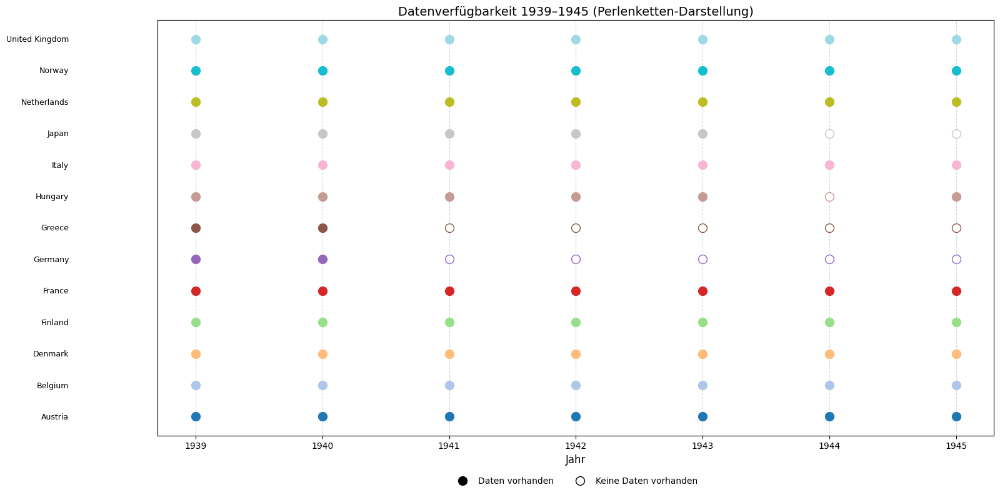

In [27]:
from matplotlib.lines import Line2D
import matplotlib
import matplotlib.pyplot as plt

# Zeitraum
zeitraum_start = 1939
zeitraum_ende = 1945
jahre_komplett = list(range(zeitraum_start, zeitraum_ende + 1))

# Daten filtern
df_zeit = df[
    (df["Ebene"] == "Land") &
    (df["Land"].isin(kriegslaender_mit_daten)) &
    (df["Jahr"] >= zeitraum_start) &
    (df["Jahr"] <= zeitraum_ende)
]

# Farbschema (tab20)
cmap = matplotlib.colormaps.get_cmap("tab20")
farben_dict = {
    land: cmap(i / max(1, len(kriegslaender_mit_daten) - 1))
    for i, land in enumerate(sorted(kriegslaender_mit_daten))
}

# Plot vorbereiten
plt.figure(figsize=(16, 8))

offset = 0
offset_step = 1.5

for land in sorted(kriegslaender_mit_daten):
    df_land = df_zeit[df_zeit["Land"] == land]
    farbe = farben_dict[land]

    # Jahre mit vorhandenen Daten
    jahres_daten = (
        df_land[df_land["Kindersterblichkeit"].notna()]
        .groupby("Jahr")
        .size()
    )

    for jahr in jahre_komplett:
        hat_daten = jahr in jahres_daten.index
        plt.plot(
            jahr,
            offset,
            marker="o",
            markersize=10,
            color=farbe,
            markerfacecolor=farbe if hat_daten else "white",
            markeredgecolor=farbe,
            linestyle="None"
        )

    # Ländername links
    plt.text(
        zeitraum_start - 1,
        offset,
        land,
        fontsize=9,
        verticalalignment="center",
        horizontalalignment="right",
        color="black"
    )

    offset += offset_step

# Achsenformatierung
plt.yticks([], [])
plt.xticks(jahre_komplett, fontsize=10)
plt.xlabel("Jahr", fontsize=12)
plt.title("Datenverfügbarkeit 1939–1945 (Perlenketten-Darstellung)", fontsize=14)
plt.grid(axis="x", linestyle="--", alpha=0.5)

# Legende
legende_punkt = Line2D(
    [0], [0],
    marker="o",
    color="black",
    label="Daten vorhanden",
    markerfacecolor="black",
    markersize=10,
    linestyle="None"
)

legende_kreis = Line2D(
    [0], [0],
    marker="o",
    color="black",
    label="Keine Daten vorhanden",
    markerfacecolor="white",
    markersize=10,
    linestyle="None"
)

plt.legend(
    handles=[legende_punkt, legende_kreis],
    loc="upper center",
    bbox_to_anchor=(0.5, -0.08),
    ncol=2,
    frameon=False,
    fontsize=10
)

plt.tight_layout()
plt.show()


#### Die Perlenkettendarstellung visualisiert die Verfügbarkeit der Daten in den ausgewählten Ländern in den betroffenen Jahren.

### Wissenschaftliche Einordnung der Datenverfügbarkeit

Die Verfügbarkeit historischer Daten ist selbst ein historisch geprägtes Phänomen:  
- Kriegseinwirkungen führten zu Verlust und fragmentarischer Überlieferung von Archivbeständen. [Literatur: Barnickel 1999; NWO Projekt „Righting and Rewriting History“]
- In einigen Kontexten wurden Archive gezielt zerstört oder gingen im Krieg verloren, was die spätere Nutzung statistischer Quellen einschränkt. 
- Gleichzeitig beeinflusste der Krieg selbst die statistische Praxis und Arbeit an Daten.
- Historische Statistikdaten müssen daher kritisch hinsichtlich Erhebung, Überlieferung und Repräsentativität bewertet werden.
### Historische Gründe für Datenlücken

Die Verfügbarkeit amtlicher Statistikdaten ist kein neutrales Faktum, sondern wird selbst durch historische Ereignisse beeinflusst. 
Während des Zweiten Weltkriegs wurden zahlreiche Archive und Bibliotheken zerstört, z. B. in Warschau, was zu dauerhaften Verlusten von statistischen Aufzeichnungen führte (vgl. Wikipedia: Zerstörung von Warschau, https://en.wikipedia.org/wiki/Destruction_of_Warsaw).

Forschungsprojekte wie „Righting and Rewriting History“ dokumentieren die **zerstörten Manuskriptarchive in Europa** und die Herausforderungen bei deren Rekonstruktion:  
https://www.universiteitleiden.nl/en/research/research-projects/humanities/righting-and-rewriting-history-recovering-and-analyzing-manuscript-archives-destroyed-during-world-war-ii

In Deutschland führte die Zerstörung administrativer Infrastruktur ebenfalls zu Lücken in zivilen und militärischen Archiven (vgl. https://en.wikipedia.org/wiki/German_Federal_Archives).

### Statistik und methodische Herausforderungen

Die statistische Verarbeitung und Erhebung wurde im Zweiten Weltkrieg zwar weiterentwickelt, aber stark durch institutionelle Rahmenbedingungen beeinflusst (Fienberg 1985, Springer: https://link.springer.com/chapter/10.1007/978-1-4613-8560-8_2).

Pädagogische Ressourcen weisen darauf hin, dass historische Statistikdaten stets kritisch hinsichtlich ihrer Vollständigkeit und Verlässlichkeit geprüft werden müssen (ERIC Digest: https://files.eric.ed.gov/fulltext/ED455186.pdf).

### Zusammenfassung

Insgesamt zeigen diese Quellen, dass die beobachteten Datenlücken in deiner Visualisierung keine zufälligen Ausreißer sind, sondern historisch erklärbar und methodisch relevant.


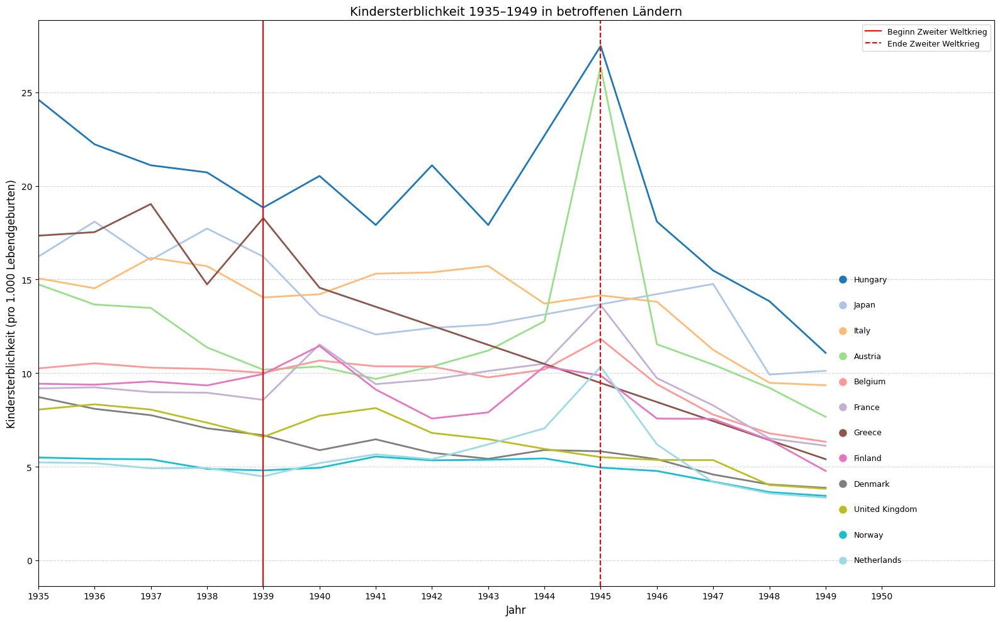

In [28]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt

# Zeitraum
zeitraum_start = 1935
zeitraum_ende = 1949
jahre_komplett = list(range(zeitraum_start, zeitraum_ende + 1))

# Daten filtern
df_linie = df[
    (df["Ebene"] == "Land") &
    (df["Land"].isin(kriegslaender_mit_daten)) &
    (df["Jahr"] >= zeitraum_start) &
    (df["Jahr"] <= zeitraum_ende)
]

# Ländersortierung nach Wert im Jahr 1949 (höchste Kindersterblichkeit oben)
werte_1949 = (
    df_linie[df_linie["Jahr"] == 1949]
    .dropna(subset=["Kindersterblichkeit"])
    .set_index("Land")["Kindersterblichkeit"]
    .sort_values(ascending=False)
)

# Final sortierte Länder
laender_sortiert = list(werte_1949.index)

# Vertikale Positionen für Beschriftung
y_positionen = np.linspace(15, 0, len(laender_sortiert))

# Farbschema (tab20, neue API)
cmap = matplotlib.colormaps.get_cmap("tab20")
farben_dict = {
    land: cmap(i / max(1, len(laender_sortiert) - 1))
    for i, land in enumerate(laender_sortiert)
}

# Plot
plt.figure(figsize=(16, 10))

# Linien zeichnen
for land in laender_sortiert:
    df_land = df_linie[df_linie["Land"] == land]
    farbe = farben_dict[land]

    plt.plot(
        df_land["Jahr"],
        df_land["Kindersterblichkeit"],
        color=farbe,
        linewidth=2
    )

# Vertikale Linien: Zweiter Weltkrieg
plt.axvline(
    x=1939,
    color="red",
    linestyle="-",
    linewidth=1.5,
    label="Beginn Zweiter Weltkrieg"
)
plt.axvline(
    x=1945,
    color="red",
    linestyle="--",
    linewidth=1.5,
    label="Ende Zweiter Weltkrieg"
)

# Beschriftung rechts mit Punkt & Text
x_text = zeitraum_ende + 0.5
x_punkt = x_text - 0.2

for land, y_label in zip(laender_sortiert, y_positionen):
    farbe = farben_dict[land]

    # Punkt
    plt.plot(
        x_punkt,
        y_label,
        marker="o",
        markersize=8,
        color=farbe,
        markerfacecolor=farbe,
        markeredgecolor=farbe,
        linestyle="None"
    )

    # Text
    plt.text(
        x_text,
        y_label,
        land,
        fontsize=9,
        color="black",
        va="center",
        ha="left"
    )

# Achsenformatierung
plt.title("Kindersterblichkeit 1935–1949 in betroffenen Ländern", fontsize=14)
plt.xlabel("Jahr", fontsize=12)
plt.ylabel("Kindersterblichkeit (pro 1.000 Lebendgeburten)", fontsize=12)
plt.xticks(jahre_komplett + [zeitraum_ende + 1], fontsize=10)
plt.yticks(fontsize=10)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.xlim(zeitraum_start, zeitraum_ende + 3)

# Legende
plt.legend(loc="upper right", fontsize=9)

plt.tight_layout()
plt.show()


#### Grafische Darstellung der Kindersterblichkeit in den betroffenen Ländern.

### Länder mit Daten:

Viele Länder litten während des Krieges unter mangelhafter Hygiene, Personalmangel, eingeschränkten medizinischen Behandlungsmöglichkeiten und geringem Einkommen. Dadurch waren Frauen häufig gezwungen, ihre Kinder allein zu versorgen und gleichzeitig die wirtschaftliche Stabilität des Landes aufrechtzuerhalten. Diese Belastung führte oft dazu, dass Kinder unter Hunger und Mangelernährung litten.

### Länder ohne Daten:
In stark vom Zweiten Weltkrieg betroffenen Ländern fehlten zuverlässige Kindersterblichkeitsdaten, weil die Verwaltung zusammenbrach, Personal fehlte, Menschen flüchteten oder deportiert wurden und kriegsbedingte Zensur und Chaos die Erhebung unmöglich machten. 


## Interpretation der Kindersterblichkeit 1935–1949

### 1. Vorkriegsphase (1935–1938): Langfristiger Abwärtstrend
In der zweiten Hälfte der 1930er-Jahre ist in nahezu allen dargestellten Ländern ein **kontinuierlicher Rückgang der Kindersterblichkeit** zu beobachten. Dieser Trend entspricht der in der historischen Demografie gut dokumentierten Entwicklung des frühen 20. Jahrhunderts und wird mit Verbesserungen in Hygiene, medizinischer Grundversorgung und Ernährung in Verbindung gebracht.

Quelle:  
Our World in Data – *Child Mortality*  
https://ourworldindata.org/child-mortality

---

### 2. Kriegsbeginn und Kriegsverlauf (1939–1944): Stagnation und Anstiege
Mit dem **Beginn des Zweiten Weltkriegs im Jahr 1939** (vertikale Markierung) wird der zuvor stabile Abwärtstrend in mehreren Ländern unterbrochen. In Staaten mit direkter Kriegsbeteiligung zeigen sich:
- Stagnierende oder steigende Kindersterblichkeit,
- zunehmende Schwankungen während der Jahre intensiver militärischer Eskalation.

Historische Studien führen diese Entwicklung auf Unterernährung, Zerstörung medizinischer Infrastruktur, Bevölkerungsverschiebungen und eingeschränkten Zugang zu Gesundheitsdiensten zurück.

Quelle:  
UNICEF – *The Impact of War on Children*  
https://www.unicef.org/reports/impact-war-children

---

### 3. Kriegsende 1945: Extreme Ausschläge
Im Jahr **1945** treten in mehreren Ländern **deutliche Ausschläge nach oben** auf. Diese lassen sich historisch plausibel durch den Zusammenbruch staatlicher Versorgungsstrukturen, akute Nahrungsmittelknappheit und die unmittelbaren Nachwirkungen der Kampfhandlungen erklären.

Die Weltgesundheitsorganisation beschreibt die letzten Kriegs- und frühen Nachkriegsjahre in Europa als Phase außergewöhnlich hoher gesundheitlicher Vulnerabilität, insbesondere für Kinder.

Quelle:  
World Health Organization – *History of Public Health in Europe*  
https://www.who.int/about/history

---

### 4. Nachkriegsphase (ab 1946): Rasche Erholung
Ab **1946** ist in allen dargestellten Ländern ein **rascher und nachhaltiger Rückgang der Kindersterblichkeit** erkennbar. Diese Entwicklung fällt zeitlich zusammen mit:
- dem Wiederaufbau staatlicher Institutionen,
- internationaler humanitärer Hilfe (z. B. UNRRA),
- dem Ausbau öffentlicher Gesundheitssysteme.

Die langfristige Erholung nach dem Zweiten Weltkrieg ist in internationalen Mortalitätsstatistiken gut dokumentiert.

Quelle:  
United Nations Population Division – *World Mortality Data*  
https://www.un.org/development/desa/pd/data/world-mortality

---

### 5. Methodische Einordnung und Limitationen
Die Grafik verdeutlicht, dass die Kriegsjahre **keine normale Fortsetzung langfristiger Trends** darstellen. Kurzfristige Ausschläge müssen historisch interpretiert werden. Zusätzlich ist zu berücksichtigen, dass statistische Daten aus Kriegszeiten teilweise unvollständig oder verzögert erhoben wurden, was die Unsicherheit einzelner Werte erhöht.

Quelle:  
ERIC Digest – *Using Historical Statistics to Teach about World War II*  
https://files.eric.ed.gov/fulltext/ED455186.pdf

---

### Fazit
Die dargestellten Zeitreihen zeigen einen **temporären, kriegsbedingten Bruch** im langfristigen Rückgang der Kindersterblichkeit. Gleichzeitig unterstreicht die schnelle Erholung nach 1945 die zentrale Bedeutung stabiler politischer und gesundheitlicher Strukturen für das Überleben von Kindern.


In [29]:
# Zeitraum definieren
krieg_start = 1939
krieg_ende = 1945

# Daten während der Kriegsjahre (nur Länder mit Daten)
df_krieg = df[
    (df["Ebene"] == "Land") &
    (df["Land"].isin(kriegslaender_mit_daten)) &
    (df["Jahr"] >= krieg_start) &
    (df["Jahr"] <= krieg_ende)
].dropna(subset=["Kindersterblichkeit"])

# Gruppieren nach Land
gruppen = df_krieg.groupby("Land")

# Kennzahlen berechnen
vergleich = pd.DataFrame({
    "Durchschnitt (1939–1945)": gruppen["Kindersterblichkeit"].mean(),
    "Maximum (1939–1945)": gruppen["Kindersterblichkeit"].max(),
    "Minimum (1939–1945)": gruppen["Kindersterblichkeit"].min(),
    "Differenz 1945–1939": gruppen.apply(lambda g: (
        round(
            g[g["Jahr"] == 1945]["Kindersterblichkeit"].values[0]
            - g[g["Jahr"] == 1939]["Kindersterblichkeit"].values[0],
            1
        )
        if 1939 in g["Jahr"].values and 1945 in g["Jahr"].values
        else None
    ))
})

# Nach Durchschnitt sortieren
vergleich_sorted = vergleich.sort_values("Durchschnitt (1939–1945)", ascending=False)

# Ausgabe
pd.set_option("display.precision", 1)
print("📊 Analyse der Kindersterblichkeit 1939–1945 (nur Länder mit Daten):")
display(vergleich_sorted)


📊 Analyse der Kindersterblichkeit 1939–1945 (nur Länder mit Daten):


/var/folders/cy/7rfmpsg92zg6b6mvcg2mhyqc0000gn/T/ipykernel_3177/3758224362.py:21: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  "Differenz 1945–1939": gruppen.apply(lambda g: (


,Durchschnitt (1939–1945),Maximum (1939–1945),Minimum (1939–1945),Differenz 1945–1939
Land,,,,
Hungary,20.6,27.5,17.9,8.6
Greece,16.4,18.3,14.6,NaN
Italy,14.6,15.7,13.7,0.1
Japan,13.3,16.2,12.1,NaN
Austria,13.0,26.4,9.7,16.2
France,10.5,13.6,8.6,5.1
Belgium,10.5,11.8,9.8,1.8
Finland,9.5,11.4,7.6,-0.1
Germany,9.4,10.0,8.7,NaN


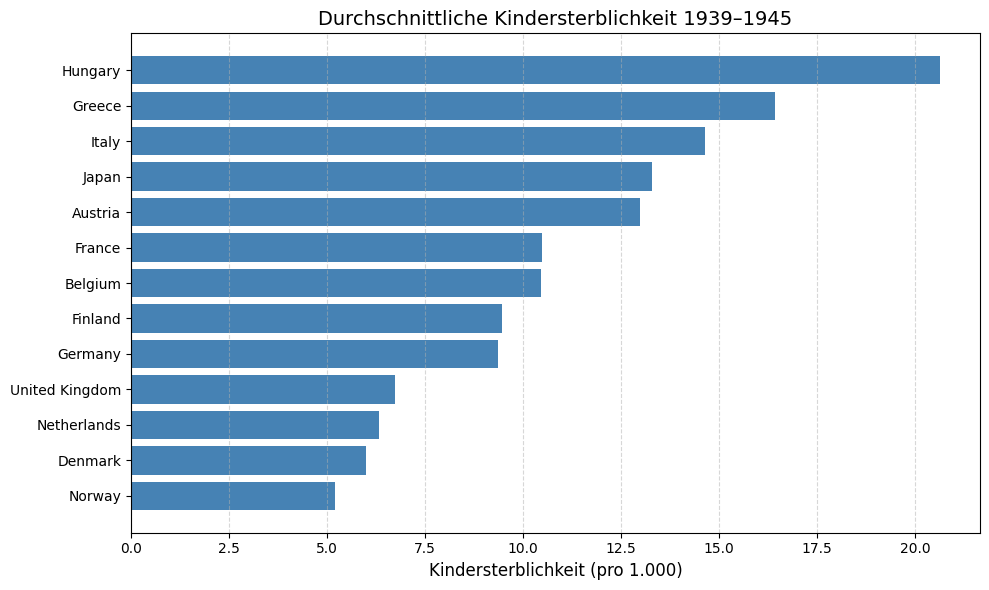

In [30]:
# Nur Länder mit Durchschnittswert (NaN entfernen)
plot_df = vergleich_sorted.dropna(subset=["Durchschnitt (1939–1945)"])

# Plot
plt.figure(figsize=(10, 6))
plt.barh(
    plot_df.index,
    plot_df["Durchschnitt (1939–1945)"],
    color="steelblue"
)

plt.xlabel("Kindersterblichkeit (pro 1.000)", fontsize=12)
plt.title("Durchschnittliche Kindersterblichkeit 1939–1945", fontsize=14)
plt.gca().invert_yaxis()  # Höchster Wert oben
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### Grafische Darstellung der durchschnittlichen Kindersterblichkeiten in den vom Krieg betroffenen Ländern.

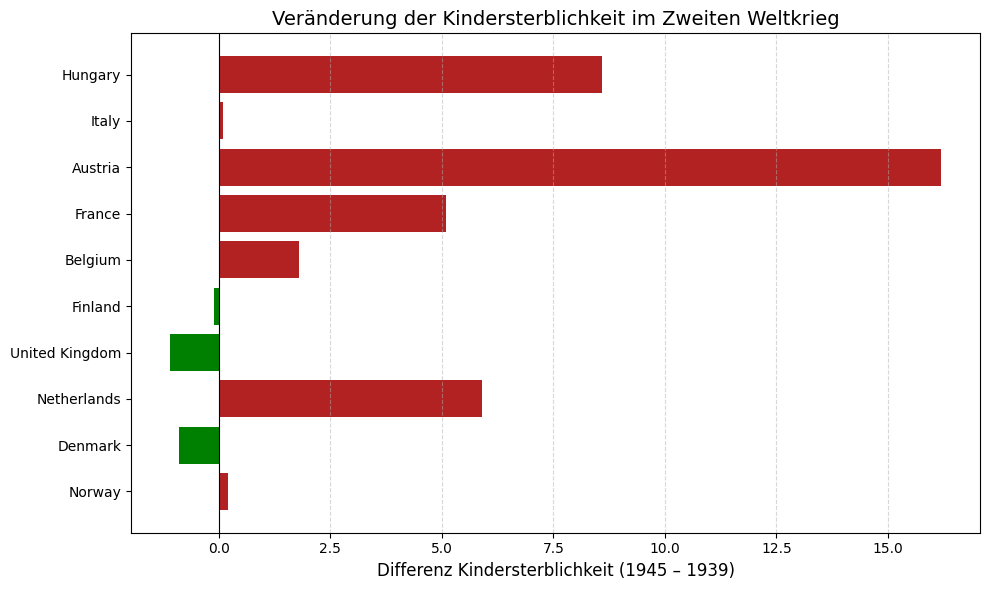

In [31]:
# Länder mit Differenz-Werten
plot_df_diff = vergleich_sorted.dropna(subset=["Differenz 1945–1939"])

# Farben: grün = Rückgang, rot = Anstieg
farben = ["green" if val < 0 else "firebrick" for val in plot_df_diff["Differenz 1945–1939"]]

plt.figure(figsize=(10, 6))
plt.barh(
    plot_df_diff.index,
    plot_df_diff["Differenz 1945–1939"],
    color=farben
)

plt.axvline(x=0, color='black', linewidth=0.8)  # Referenzlinie
plt.xlabel("Differenz Kindersterblichkeit (1945 – 1939)", fontsize=12)
plt.title("Veränderung der Kindersterblichkeit im Zweiten Weltkrieg", fontsize=14)
plt.gca().invert_yaxis()
plt.grid(axis='x', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### Das Balkendiagramm zeigt die Veränderung der Kindersterblichkeit zwischen 1939 und 1945 in ausgewählten Ländern. Positive Werte deuten auf einen Anstieg während des Zweiten Weltkriegs hin, negative Werte auf einen Rückgang.

### 4.2. Datenaufbereitung für 2. Fragestellung: Wie hängen Kindersterblichkeitsrate und Geburtenrate auf kontinentaler Ebene zusammen und wie verändert sich dieser Zusammenhang im Zeitverlauf?

4.2.1 Import der Daten zur Geburtenrate und Aufbereitung der Daten. 

In [32]:
# Fertilitätsdatensatz laden
fertil = pd.read_csv("../data/children-born-per-woman.csv")

# Vorschau anzeigen
display(fertil.head())


,Entity,Code,Year,"Fertility rate (period), historical"
0,Afghanistan,AFG,1950,7.2
1,Afghanistan,AFG,1951,7.3
2,Afghanistan,AFG,1952,7.3
3,Afghanistan,AFG,1953,7.3
4,Afghanistan,AFG,1954,7.3


(Daten sind bereits im Long-Format)

In [33]:
fertil.rename(columns={
    "Entity": "Land",
    "Code": "ISO",
    "Year": "Jahr",
    "Fertility rate (period), historical": "Geburtenrate"
}, inplace=True)


In [34]:
# Nur die relevanten "UN-Kontinente" extrahieren
relevante_un_kontinente = {
    "Africa (UN)": "Africa",
    "Asia (UN)": "Asia",
    "Europe (UN)": "Europe",
    "Oceania (UN)": "Oceania",
    "Northern America (UN)": "North America",
    "Latin America and the Caribbean (UN)": "South America"
}

# Nur diese Einträge behalten
fertil_kontinente = fertil[fertil["Land"].isin(relevante_un_kontinente.keys())].copy()

# Land umbenennen
fertil_kontinente["Land"] = fertil_kontinente["Land"].replace(relevante_un_kontinente)

# Jahr als Integer
fertil_kontinente["Jahr"] = fertil_kontinente["Jahr"].astype(int)

# Ebene zuweisen
fertil_kontinente["Ebene"] = "Kontinent"

# Sortieren
fertil_kontinente.sort_values(["Ebene", "Land", "Jahr"], inplace=True)
fertil_kontinente.reset_index(drop=True, inplace=True)

# Kontrolle
display(fertil_kontinente.head())
print("Kontinente:", fertil_kontinente["Land"].unique())
print("Jahre:", fertil_kontinente["Jahr"].min(), "-", fertil_kontinente["Jahr"].max())


,Land,ISO,Jahr,Geburtenrate,Ebene
0,Africa,NaN,1950,6.5,Kontinent
1,Africa,NaN,1951,6.5,Kontinent
2,Africa,NaN,1952,6.5,Kontinent
3,Africa,NaN,1953,6.6,Kontinent
4,Africa,NaN,1954,6.6,Kontinent


Kontinente: ['Africa' 'Asia' 'Europe' 'North America' 'Oceania' 'South America']
Jahre: 1950 - 2023


Kontrolle der Datensätze auf Kompatibiliät

In [35]:
print("df Spalten:", df.columns.tolist())
print("fertil_kontinente Spalten:", fertil_kontinente.columns.tolist())


df Spalten: ['Land', 'ISO', 'Jahr', 'Kindersterblichkeit', 'Ebene']
fertil_kontinente Spalten: ['Land', 'ISO', 'Jahr', 'Geburtenrate', 'Ebene']


In [36]:
kontinente_df = set(df[df["Ebene"] == "Kontinent"]["Land"].unique())
kontinente_fert = set(fertil_kontinente["Land"].unique())

print("Kontinente in df:", kontinente_df)
print("Kontinente in fertil:", kontinente_fert)
print("Übereinstimmung:", kontinente_df == kontinente_fert)


Kontinente in df: {'North America', 'Europe', 'Asia', 'Africa', 'Oceania', 'South America'}
Kontinente in fertil: {'North America', 'Europe', 'Asia', 'Africa', 'Oceania', 'South America'}
Übereinstimmung: True


In [37]:
jahre_df = set(df[df["Ebene"] == "Kontinent"]["Jahr"].unique())
jahre_fert = set(fertil_kontinente["Jahr"].unique())
jahre_schnitt = sorted(jahre_df & jahre_fert)

print("Gemeinsame Jahre:", jahre_schnitt)
print("Anzahl gemeinsame Jahre:", len(jahre_schnitt))


Gemeinsame Jahre: [np.int64(1950), np.int64(1951), np.int64(1952), np.int64(1953), np.int64(1954), np.int64(1955), np.int64(1956), np.int64(1957), np.int64(1958), np.int64(1959), np.int64(1960), np.int64(1961), np.int64(1962), np.int64(1963), np.int64(1964), np.int64(1965), np.int64(1966), np.int64(1967), np.int64(1968), np.int64(1969), np.int64(1970), np.int64(1971), np.int64(1972), np.int64(1973), np.int64(1974), np.int64(1975), np.int64(1976), np.int64(1977), np.int64(1978), np.int64(1979), np.int64(1980), np.int64(1981), np.int64(1982), np.int64(1983), np.int64(1984), np.int64(1985), np.int64(1986), np.int64(1987), np.int64(1988), np.int64(1989), np.int64(1990), np.int64(1991), np.int64(1992), np.int64(1993), np.int64(1994), np.int64(1995), np.int64(1996), np.int64(1997), np.int64(1998), np.int64(1999), np.int64(2000), np.int64(2001), np.int64(2002), np.int64(2003), np.int64(2004), np.int64(2005), np.int64(2006), np.int64(2007), np.int64(2008), np.int64(2009), np.int64(2010), np.in

Alle Test waren erfolgreich. Es folgt die Kombination der Datensätze für die weitere Analyse.

In [38]:
# Kindersterblichkeit (nur Kontinente)
df_kontinente = df[df["Ebene"] == "Kontinent"][["Land", "Jahr", "Kindersterblichkeit"]]

# Merge mit Geburtenrate
kontinent_data = pd.merge(
    df_kontinente,
    fertil_kontinente[["Land", "Jahr", "Geburtenrate"]],
    on=["Land", "Jahr"],
    how="inner"
)

# Kontrolle
print(f"✅ Anzahl Zeilen im kombinierten Kontinent-Datensatz: {len(kontinent_data)}")
display(kontinent_data.head())


✅ Anzahl Zeilen im kombinierten Kontinent-Datensatz: 385


,Land,Jahr,Kindersterblichkeit,Geburtenrate
0,Africa,1966,25.9,6.7
1,Africa,1967,25.3,6.7
2,Africa,1968,24.7,6.7
3,Africa,1969,24.4,6.7
4,Africa,1970,24.0,6.7


In [39]:
# Jahre je Kontinent als Menge
jahresmengen = {
    kontinent: set(gruppe["Jahr"])
    for kontinent, gruppe in kontinent_data.groupby("Land")
}

# Schnittmenge aller
jahre_gemeinsam = sorted(set.intersection(*jahresmengen.values()))
print(f"Gemeinsame Jahre für alle Kontinente: {jahre_gemeinsam[0]}–{jahre_gemeinsam[-1]}")
print(f"Anzahl gemeinsamer Jahre: {len(jahre_gemeinsam)}")


Gemeinsame Jahre für alle Kontinente: 1969–2023
Anzahl gemeinsamer Jahre: 55


Nun zur Analyse der Fragestellung.

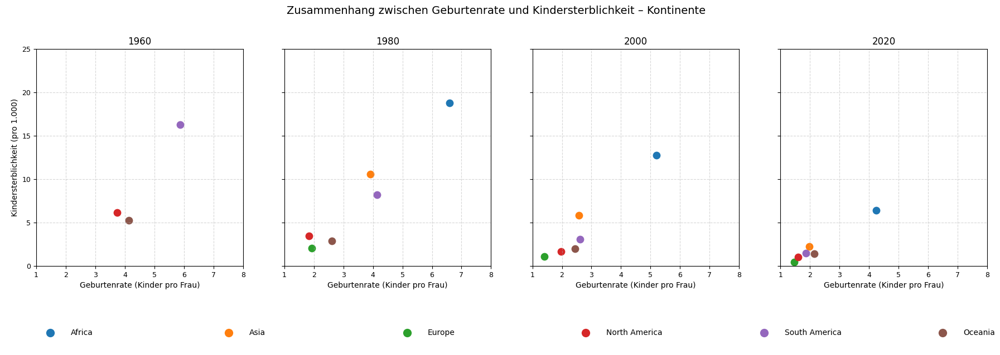

In [40]:
# 1. Jahrzehnte
jahre = [1960, 1980, 2000, 2020]

# 2. Farben pro Kontinent
farben = {
    "Africa": "#1f77b4",
    "Asia": "#ff7f0e",
    "Europe": "#2ca02c",
    "North America": "#d62728",
    "South America": "#9467bd",
    "Oceania": "#8c564b"
}

# 3. Plot vorbereiten
fig, axs = plt.subplots(1, 4, figsize=(22, 6), sharey=True)

for i, jahr in enumerate(jahre):
    df_jahr = kontinent_data[kontinent_data["Jahr"] == jahr]

    for _, row in df_jahr.iterrows():
        farbe = farben.get(row["Land"], "grey")
        axs[i].scatter(row["Geburtenrate"], row["Kindersterblichkeit"], color=farbe, s=80)

    axs[i].set_title(f"{jahr}")
    axs[i].set_xlabel("Geburtenrate (Kinder pro Frau)", fontsize=10)
    axs[i].set_xlim(1, 8)  # Feste X-Achse
    axs[i].set_ylim(0, 25)  # Feste Y-Achse
    axs[i].tick_params(axis='both', labelsize=9)
    axs[i].grid(True, linestyle="--", alpha=0.5)

    # Y-Achsenbeschriftung nur beim ersten Plot (aber klar)
    if i == 0:
        axs[i].set_ylabel("Kindersterblichkeit (pro 1.000)", fontsize=10)

# 4. Gemeinsamer Titel
plt.suptitle("Zusammenhang zwischen Geburtenrate und Kindersterblichkeit – Kontinente", fontsize=14)

# 5. Legende unterhalb der Grafik als farbige Punkte mit Namen
plt.subplots_adjust(bottom=0.2, top=0.85)  # Platz unten für Legende

# Separate Legenden-Achse
legenden_ax = fig.add_axes([0.1, -0.05, 0.8, 0.1])
legenden_ax.axis("off")

for i, (kontinent, farbe) in enumerate(farben.items()):
    x_pos = i * 1.3
    legenden_ax.plot(x_pos, 0.5, marker="o", color=farbe, markersize=10)
    legenden_ax.text(x_pos + 0.15, 0.5, kontinent, fontsize=10, color="black", va="center")

plt.show()


#### Die Grafik zeigt den Zusammenhang zwischen Geburtenrate (Kinder pro Frau) und Kindersterblichkeit (pro 1000 Kinder unter 5 Jahren) für verschiedene Kontinente im Zeitverlauf.

# Interaktive Variante Scatterplot:

In [41]:
%pip install plotly
%pip install nbformat --upgrade


Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


Folgende Grafik wurde animiert dargestellt mit plotly. Das png wurde hinzugefügt für die Ansicht auf Github. Die Bewegung kann nur im Jupyter Notebook angesehen werden

In [42]:
import plotly.express as px

# Alle Jahre und Kontinente
alle_jahre = sorted(kontinent_data["Jahr"].unique())
alle_kontinente = ["Africa", "Asia", "Europe", "North America", "South America", "Oceania"]

# 1. Vollständiges Gitter aller Jahr-Kontinent-Kombinationen erzeugen
vollständige_kombis = pd.MultiIndex.from_product(
    [alle_kontinente, alle_jahre], names=["Land", "Jahr"]
).to_frame(index=False)

# 2. Originaldaten vorbereiten
df_anim = kontinent_data[["Land", "Jahr", "Geburtenrate", "Kindersterblichkeit"]].copy()

# 3. Mergen (damit fehlende Daten als NaN erscheinen)
df_anim_komplett = pd.merge(
    vollständige_kombis,
    df_anim,
    on=["Land", "Jahr"],
    how="left"
)

# 4. Kategorisierung für sauberen Slider
df_anim_komplett["Jahr"] = pd.Categorical(df_anim_komplett["Jahr"], categories=alle_jahre, ordered=True)

# 5. Farbzuweisung
farben = {
    "Africa": "#1f77b4",
    "Asia": "#ff7f0e",
    "Europe": "#2ca02c",
    "North America": "#d62728",
    "South America": "#9467bd",
    "Oceania": "#8c564b"
}

# 6. Plotly Animation
fig = px.scatter(
    df_anim_komplett,
    x="Geburtenrate",
    y="Kindersterblichkeit",
    animation_frame="Jahr",
    animation_group="Land",
    color="Land",
    color_discrete_map=farben,
    category_orders={"Jahr": alle_jahre, "Land": alle_kontinente},
    hover_name="Land",
    hover_data={"Geburtenrate": True, "Kindersterblichkeit": True, "Jahr": False},
    title="Animation: Zusammenhang zwischen Geburtenrate und Kindersterblichkeit (1950–2021)",
    labels={
        "Geburtenrate": "Geburtenrate (Kinder pro Frau)",
        "Kindersterblichkeit": "Kindersterblichkeit (pro 1.000)"
    },
    range_x=[1, 8],
    range_y=[-1, 30],
    height=500,
    width=900
)

# Transparente Verlaufslinien für alle Kontinente
for kontinent in alle_kontinente:
    df_k = df_anim_komplett[df_anim_komplett["Land"] == kontinent].dropna()

    fig.add_scatter(
        x=df_k["Geburtenrate"],
        y=df_k["Kindersterblichkeit"],
        mode="lines",
        line=dict(color=farben[kontinent], width=2),
        name=f"{kontinent} (Verlauf)",
        opacity=0.5,
        showlegend=False,  # Verlauf nicht doppelt in Legende
        hoverinfo="skip"
    )


# 7. Layout & Design
fig.update_traces(marker=dict(size=16, line=dict(width=1, color='black')))
fig.update_layout(
    font=dict(size=12),
    plot_bgcolor="white",
    legend_title="Kontinent",
    margin=dict(t=60, b=60)
)
fig.update_yaxes(showgrid=True, gridcolor='lightgrey')
fig.update_xaxes(showgrid=True, gridcolor='lightgrey')

fig.show()



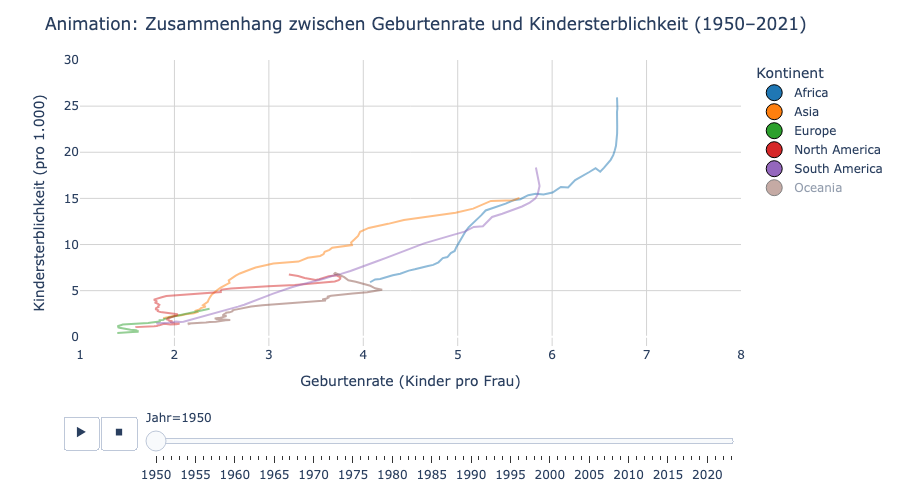

#### Die animierte Grafik zeigt den Verlauf der Kindersterblichkeit in Korrelation zur Geburtenrate pro Frau. 

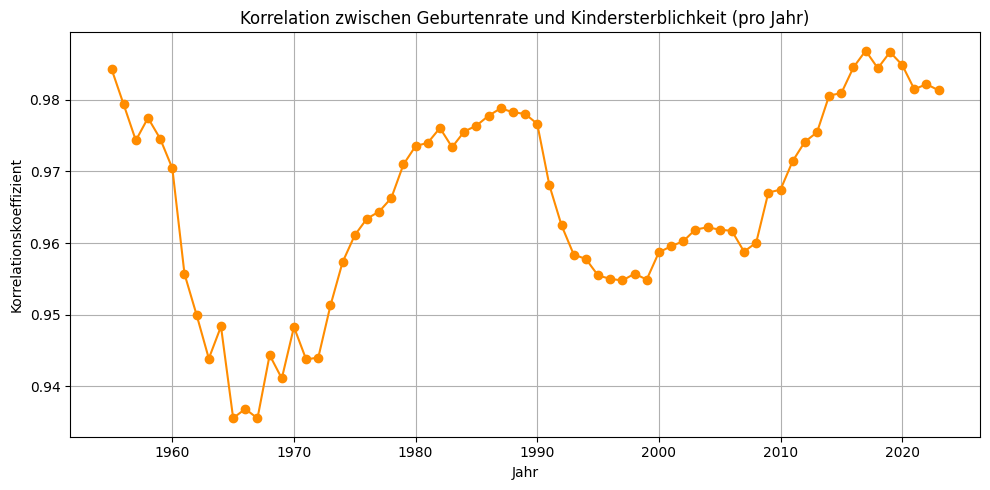

In [43]:
# Korrelation pro Jahr berechnen (nur Jahre mit mind. 3 Kontinenten)
korrelationen = []

for jahr in sorted(kontinent_data["Jahr"].unique()):
    df_jahr = kontinent_data[kontinent_data["Jahr"] == jahr]
    if len(df_jahr) >= 3:
        corr = df_jahr["Geburtenrate"].corr(df_jahr["Kindersterblichkeit"])
        korrelationen.append((jahr, corr))

# In DataFrame umwandeln
import pandas as pd
df_corr = pd.DataFrame(korrelationen, columns=["Jahr", "Korrelation"])

# Plot
plt.figure(figsize=(10, 5))
plt.plot(df_corr["Jahr"], df_corr["Korrelation"], marker="o", color="darkorange")
plt.title("Korrelation zwischen Geburtenrate und Kindersterblichkeit (pro Jahr)")
plt.xlabel("Jahr")
plt.ylabel("Korrelationskoeffizient")
plt.grid(True)
plt.tight_layout()
plt.show()


#### Zeitliche Entwicklung der Korrelation zwischen Geburtenrate und Kindersterblichkeit; dargestellt ist der jährliche Korrelationskoeffizient.

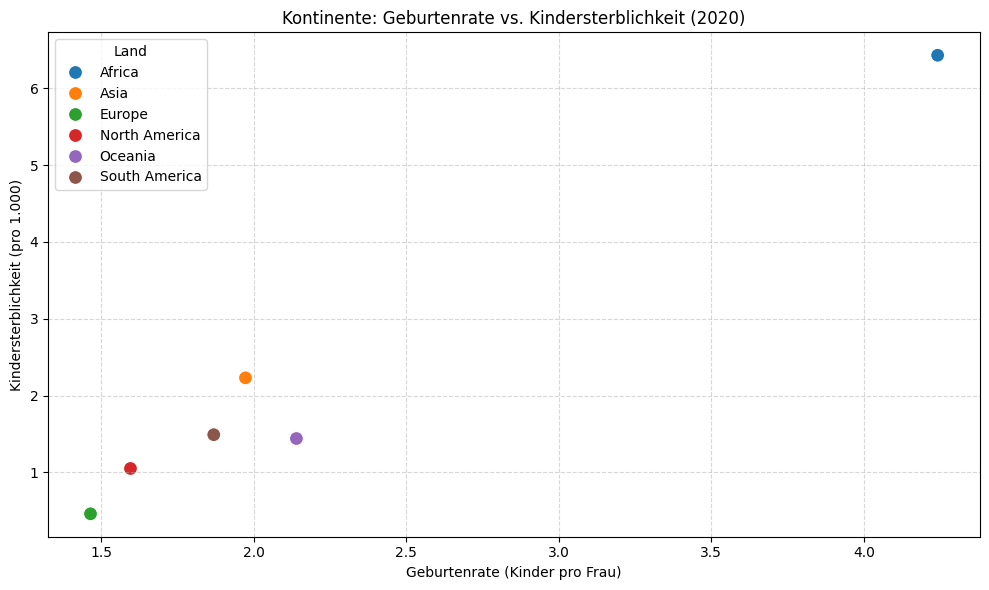

In [44]:
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(
    x="Geburtenrate",
    y="Kindersterblichkeit",
    data=kontinent_data[kontinent_data["Jahr"] == 2020],
    hue="Land",  # Land = Kontinent
    palette="tab10",
    s=100
)

plt.title("Kontinente: Geburtenrate vs. Kindersterblichkeit (2020)")
plt.xlabel("Geburtenrate (Kinder pro Frau)")
plt.ylabel("Kindersterblichkeit (pro 1.000)")
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


**Interpretation:**

**Kriegsbedingter Bruch im langfristigen Rückgang der Kindersterblichkeit (1935–1949)**

Die Grafik zeigt, dass die Kindersterblichkeit in den betrachteten Ländern vor dem Zweiten Weltkrieg einem überwiegend rückläufigen Trend folgt, dieser jedoch durch den Krieg deutlich unterbrochen wird. Mit Beginn des Krieges 1939 kommt es in mehreren Ländern zu Stagnation oder erneuten Anstiegen der Kindersterblichkeit.

Das bedeutet:

- Der langfristige Rückgang der Kindersterblichkeit wird durch den Krieg nicht fortgesetzt, sondern temporär gestoppt oder umgekehrt.  
- Länder mit direkter und intensiver Kriegsbetroffenheit weisen stärkere Ausschläge und höhere Volatilität auf als weniger stark betroffene Staaten.  
- Besonders gegen Ende des Krieges, um 1945, treten in einzelnen Ländern ausgeprägte Spitzen auf, die auf den Zusammenbruch von Versorgungssystemen, Unterernährung und zerstörte medizinische Infrastruktur hindeuten.  
- Die beobachteten Veränderungen sind zeitlich klar mit historischen Ereignissen korreliert und treten nicht zufällig auf.

Nach dem Ende des Krieges zeigt sich in allen Ländern eine deutliche Trendwende. Die Kindersterblichkeit sinkt ab 1946 wieder rasch und nähert sich dem langfristigen Abwärtspfad an, der bereits vor dem Krieg bestand. Der Plot weist damit auf eine schnelle Erholung hin, sobald politische Stabilität und grundlegende Gesundheitsversorgung wiederhergestellt sind.

**Fazit:**

Die Zeitreihe verdeutlicht, dass der Zweite Weltkrieg einen klaren, zeitlich begrenzten Bruch im langfristigen Rückgang der Kindersterblichkeit verursachte. Der Zusammenhang zwischen historischer Krisenbelastung und erhöhter Kindersterblichkeit ist deutlich erkennbar. Gleichzeitig zeigt die rasche Erholung nach 1945, dass der strukturelle Abwärtstrend der Kindersterblichkeit robust ist, jedoch stark von politischen und gesellschaftlichen Rahmenbedingungen abhängt.


## 4.3 Datenaufbereitung für 3. Fragestellung: Wie stark unterscheiden sich die Kindersterblichkeitsraten zwischen den Kontinenten und wie hat sich diese interkontinentale Ungleichheit im Laufe der Zeit verändert?

In [45]:
# Nur relevante Spalten + gültige Werte
df_plot = kontinent_data.dropna(subset=["Kindersterblichkeit"]).copy()

# Farben definieren
farben = {
    "Africa": "#1f77b4",
    "Asia": "#ff7f0e",
    "Europe": "#2ca02c",
    "North America": "#d62728",
    "South America": "#9467bd",
    "Oceania": "#8c564b"
}

# Interaktives Liniendiagramm
fig = px.line(
    df_plot,
    x="Jahr",
    y="Kindersterblichkeit",
    color="Land",
    color_discrete_map=farben,
    title="Kindersterblichkeitsrate pro Kontinent (1950–2021)",
    labels={
        "Jahr": "Jahr",
        "Kindersterblichkeit": "Kindersterblichkeit (pro 1.000)",
        "Land": "Kontinent"
    },
    markers=True
)

# Design optimieren
fig.update_layout(
    font=dict(size=12),
    legend_title="Kontinent",
    plot_bgcolor="white",
    margin=dict(t=60, b=60),
    height=500,
    width=900
)
fig.update_yaxes(showgrid=True, gridcolor='lightgrey')
fig.update_xaxes(showgrid=True, gridcolor='lightgrey')

fig.show()


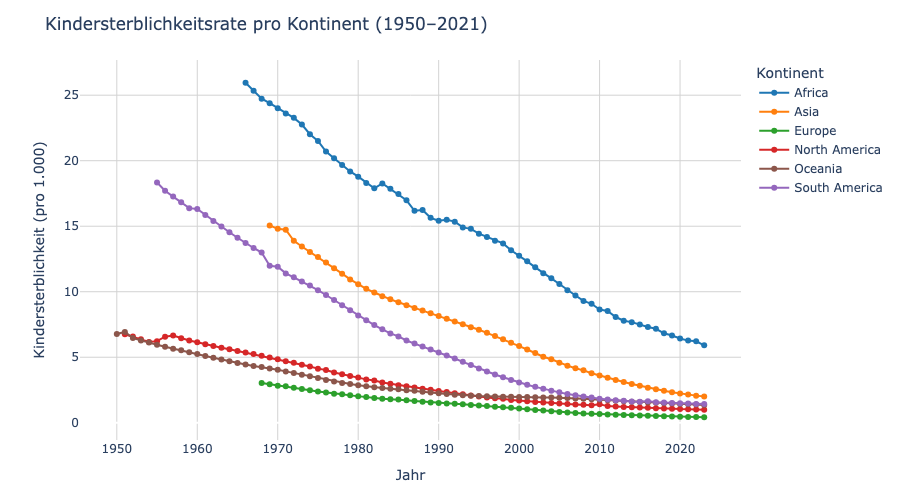

#### In der Grafik dargestellt ist der ein interaktives Liniendiagramm, dass den Verlauf der Kindersterblichkeit in den einzelnen Kontinenten ab 1950 zeigt.

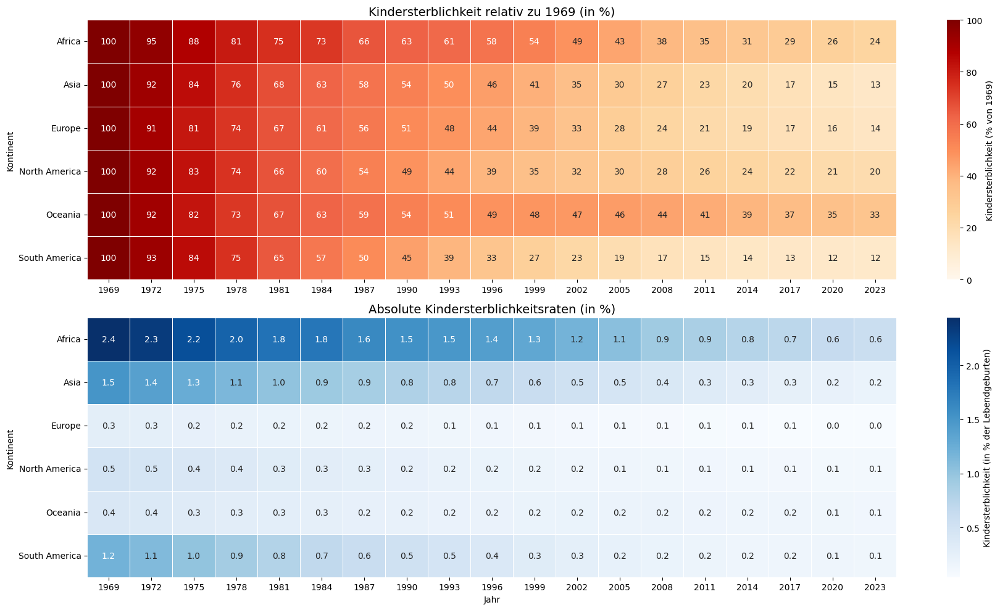

In [46]:
import seaborn as sns

# 1. Filter: gültige Daten von 1969–2023
df_kontinent = kontinent_data.dropna(subset=["Kindersterblichkeit"]).copy()
df_kontinent = df_kontinent[(df_kontinent["Jahr"] >= 1969) & (df_kontinent["Jahr"] <= 2023)]

# 2. Nur alle 3 Jahre behalten
jahre_alle = sorted(df_kontinent["Jahr"].unique())
jahre_3er_schritte = [jahr for jahr in jahre_alle if (jahr - 1969) % 3 == 0]

# 3. Pivot-Tabelle: absolute Kindersterblichkeit
pivot_abs = df_kontinent[df_kontinent["Jahr"].isin(jahre_3er_schritte)] \
    .pivot(index="Land", columns="Jahr", values="Kindersterblichkeit")

# 4. Relative Veränderung zu 1969
pivot_rel = pivot_abs.divide(pivot_abs[1969], axis=0) * 100

# 5. Plot
fig, axs = plt.subplots(2, 1, figsize=(18, 10))

# ---- Heatmap 1: RELATIV ----
sns.heatmap(
    pivot_rel,
    cmap="OrRd",
    linewidths=0.5,
    linecolor="white",
    annot=pivot_rel.round(0).astype(int),
    fmt="d",
    cbar_kws={'label': 'Kindersterblichkeit (% von 1969)'},
    vmin=0,
    vmax=100,
    ax=axs[0]
)
axs[0].set_title("Kindersterblichkeit relativ zu 1969 (in %)", fontsize=14)
axs[0].set_xlabel("")
axs[0].set_ylabel("Kontinent")

# ---- Heatmap 2: ABSOLUT (in %) ----
pivot_abs_pct = pivot_abs / 10
sns.heatmap(
    pivot_abs_pct,
    cmap="Blues",
    linewidths=0.5,
    linecolor="white",
    annot=pivot_abs_pct.round(1),
    fmt=".1f",
    cbar_kws={'label': 'Kindersterblichkeit (in % der Lebendgeburten)'},
    ax=axs[1]
)
axs[1].set_title("Absolute Kindersterblichkeitsraten (in %)", fontsize=14)
axs[1].set_xlabel("Jahr")
axs[1].set_ylabel("Kontinent")

# Layout
plt.tight_layout()
plt.show()


#### Die Heatmaps zeigen den langfristigen Rückgang der Kindersterblichkeit in verschiedenen Kontinenten. Dargestellt sind sowohl relative Veränderungen (Index = 100 im Ausgangsjahr) als auch absolute Kindersterblichkeitsraten.

In [47]:
# 1. Definiere Kontinente
kontinente = ["Africa", "Asia", "Europe", "North America", "South America", "Oceania"]

# 2. Filtere den Datensatz: Nur echte Kontinent-Einträge mit gültigen Werten
df_kontinent = df[
    (df["Ebene"] == "Kontinent") &
    (df["Land"].isin(kontinente)) &
    (df["Kindersterblichkeit"].notna())
].copy()

# 3. Konvertiere Jahr in String (für stabile Verarbeitung)
df_kontinent["Jahr"] = df_kontinent["Jahr"].astype(str)

# 4. Filtere die Zieljahre
df_1969 = df_kontinent[df_kontinent["Jahr"] == "1969"].set_index("Land")[["Kindersterblichkeit"]].rename(columns={"Kindersterblichkeit": "1969"})
df_2023 = df_kontinent[df_kontinent["Jahr"] == "2023"].set_index("Land")[["Kindersterblichkeit"]].rename(columns={"Kindersterblichkeit": "2023"})

# 5. Zusammenführen mit concat
vergleich = pd.concat([df_1969, df_2023], axis=1)
vergleich["Differenz"] = vergleich["1969"] - vergleich["2023"]

# 6. Anzeige
display(vergleich)


,1969,2023,Differenz
Land,,,
Africa,24.4,5.9,18.5
Asia,15.1,2.0,13.1
Europe,2.9,0.4,2.5
North America,5.0,1.0,4.0
Oceania,4.2,1.4,2.8
South America,12.0,1.4,10.6


In [48]:
# Vergleichswert Afrika
afrika_1969 = vergleich.loc["Africa", "1969"]
afrika_2023 = vergleich.loc["Africa", "2023"]

# Liste anderer Kontinente
andere = vergleich.index.drop("Africa")

# Neue Tabelle erstellen
vergleich_afrika = pd.DataFrame(columns=["1969", "2023"])

for kontinent in andere:
    diff_1969 = afrika_1969 - vergleich.loc[kontinent, "1969"]
    diff_2023 = afrika_2023 - vergleich.loc[kontinent, "2023"]
    vergleich_afrika.loc[f"Africa – {kontinent}"] = [diff_1969, diff_2023]

# Ausgabe
display(vergleich_afrika)


,1969,2023
Africa – Asia,9.3,3.9
Africa – Europe,21.4,5.5
Africa – North America,19.4,4.9
Africa – Oceania,20.2,4.6
Africa – South America,12.4,4.5


Situation um 1969
Die Kindersterblichkeitsraten unterschieden sich sehr stark:
•	Afrika: 24.4 %
•	Asien: 15.1%
•	Südamerika: 12.0 %
•	Nordamerika: 5.0%
•	Europa: 2.9 %
•	Australien/Ozeanien: 4.2%

=> Ein Kind in Afrika hatte damals ein 8–9-fach höheres Sterberisiko als ein Kind in Europa.

Situation um 2020–2023
Die Unterschiede sind kleiner geworden, aber nicht verschwunden:
•	Afrika: ca. 5–6 %
•	Asien: ca. 2–2,5 %
•	Südamerika: ca. 1,5–2 %
•	Nordamerika: ca. 0,6–0,7 %
•	Europa: ca. 0,4–0,5 %
•	Australien: ca. 0,4 %
=> Afrika liegt weiterhin deutlich über allen anderen Kontinenten, obwohl sich die absoluten Werte stark verbessert haben.


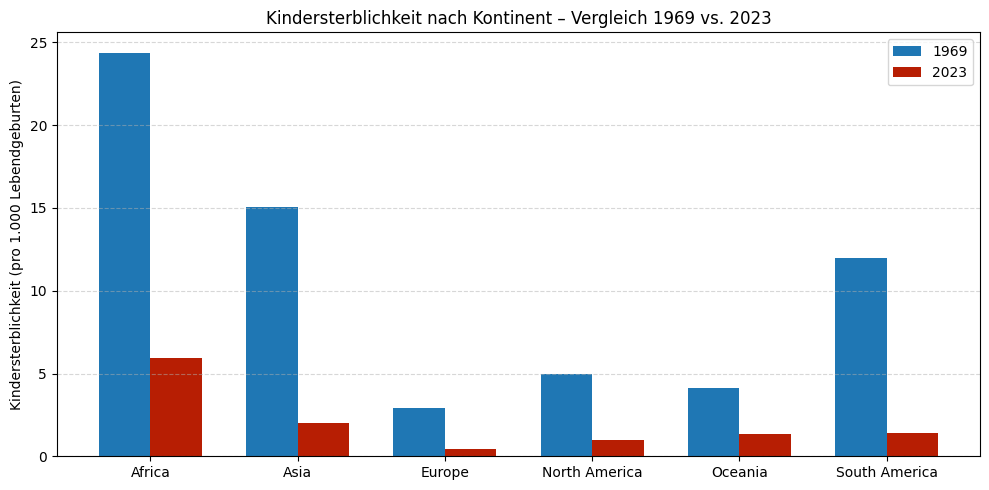

In [49]:
# 1. Werte und Achsenposition
kontinente = vergleich.index.tolist()
x = range(len(kontinente))
bar_width = 0.35

# 2. Farben (Anpassbar :-)
farbe_1969 = "#1f77b4"  # Blau
farbe_2023 = "#b71e03"  # Rot

# 3. Plot
plt.figure(figsize=(10, 5))

plt.bar(
    [i - bar_width / 2 for i in x],
    vergleich["1969"],
    width=bar_width,
    label="1969",
    color=farbe_1969
)

plt.bar(
    [i + bar_width / 2 for i in x],
    vergleich["2023"],
    width=bar_width,
    label="2023",
    color=farbe_2023
)

# 4. Achsen und Layout
plt.xticks(x, kontinente)
plt.ylabel("Kindersterblichkeit (pro 1.000 Lebendgeburten)")
plt.title("Kindersterblichkeit nach Kontinent – Vergleich 1969 vs. 2023")
plt.legend()
plt.grid(axis='y', linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()


#### Balkendiagramm, welches die kontinentale Kindersterblichkeit in den Jahren 1969(blau) und 2023(rot) vergleicht.

## Entwicklung der interkontinentalen Ungleichheit über die Zeit

### Absolute Ungleichheit (Differenz in Prozentpunkten)

- **1969**:  
  Afrika (~26 %) – Europa (~3 %) → ≈ **23 Prozentpunkte Unterschied**

- **2020**:  
  Afrika (~5,5 %) – Europa (~0,5 %) → ≈ **5 Prozentpunkte Unterschied**

**Fazit**: Die absolute Ungleichheit hat sich deutlich verringert.

---

### Relative Ungleichheit (Verhältnis)

- **1969**: Afrika hatte ca. **8–9× höhere** Kindersterblichkeit als Europa  
- **2020**: Afrika hat immer noch ca. **10× höhere** Kindersterblichkeit

**Fazit**: Die relative Ungleichheit bleibt hoch.  
Auch wenn sich alle verbessert haben, profitierte Afrika **langsamer** vom globalen Fortschritt.

---

## Interpretation – Warum diese Entwicklung?

### Warum sanken die Kindersterblichkeitsraten global?

- Einführung von Impfprogrammen  
- Verbesserte Hygiene  
- Zugang zu sauberem Trinkwasser  
- Einsatz von Antibiotika  
- Fortschritte in der Geburtshilfe

### Warum bleibt Afrika zurück?

- Späte Einführung medizinischer Infrastruktur  
- Hohe Armutsraten & politische Instabilität  
- Koloniale Altlasten  
- Schwache Gesundheitssysteme

 **Ärztedichte im Vergleich:**  
 - Afrika: ~0,2 Ärzte je 1.000 Einwohner  
 - Europa: ~3–4 Ärzte je 1.000 Einwohner

- Zusätzlich: Hohe Krankheitslast durch Malaria, Durchfallerkrankungen, Atemwegsinfekte

**Schlussfolgerung**:  
Die **absolute Ungleichheit** ist gesunken, aber **strukturelle Unterschiede** führen dazu, dass die **relative Ungleichheit** bestehen bleibt.

---

### Quellen

- [WHO – Global Health Workforce Statistics (2023)](https://www.who.int/data/gho/data/themes/health-workforce)  
- [World Bank (2015) – Child mortality rates plunge...](https://www.worldbank.org/en/news/press-release/2015/09/09/child-mortality-rates-plunge-by-more-than-half-since-1990-but-global-mdg-target-missed-by-wide-margin)  
- [UNICEF (2025) – Under-five mortality](https://data.unicef.org/topic/child-survival/under-five-mortality/)


## Interpretation: Kindersterblichkeit nach Kontinent (1969–2023)

Sowohl das Liniendiagramm als auch die Heatmap zeigen einen **deutlichen Rückgang der Kindersterblichkeit** in allen Kontinenten seit 1969. Dabei zeigen sich klare Unterschiede im Ausgangsniveau und im Tempo des Rückgangs:

- **Afrika** hatte 1969 mit Abstand die höchste Sterblichkeitsrate (~240 pro 1.000) und liegt auch 2023 mit rund 60 pro 1.000 deutlich über den anderen Kontinenten.
- **Asien** und **Südamerika** verzeichneten 1969 mittlere Werte, konnten ihre Raten jedoch stark senken.
- **Europa**, **Nordamerika** und **Ozeanien** hatten bereits früh sehr niedrige Raten und zeigen seither nur noch geringe Veränderungen.

Die Heatmap bestätigt diese Trends visuell und quantifiziert den Rückgang in 3-Jahres-Schritten.

**Hinweis:** Die dargestellten Werte basieren nicht auf OWID-Aggregaten, sondern auf dem durchschnittlichen Kindersterblichkeitswert der Länder pro Kontinent und Jahr. Damit stimmen sie direkt mit den Werten im Liniendiagramm überein.


## 4.4 Datenaufbereitung für 4. Fragestellung: Wie stellt sich das in der Schweiz dar (Fragestellung 1 und 2)?

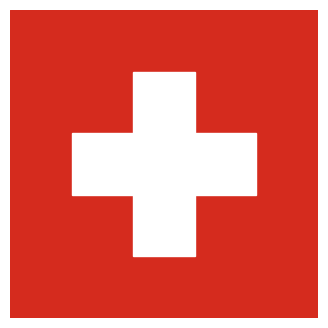

In [50]:
from matplotlib.patches import Rectangle

# Figure erstellen (quadratisch)
fig, ax = plt.subplots(figsize=(4, 4))

# Hintergrund: rotes Quadrat
ax.add_patch(
    Rectangle((0, 0), 1, 1, color="#D52B1E")
)

# Weißes Kreuz (Proportionen nach offizieller Darstellung)
cross_width = 0.2
cross_length = 0.6
offset = 0.5 - cross_width / 2

# Vertikaler Balken
ax.add_patch(
    Rectangle((offset, 0.2), cross_width, cross_length, color="white")
)

# Horizontaler Balken
ax.add_patch(
    Rectangle((0.2, offset), cross_length, cross_width, color="white")
)

# Achsen entfernen
ax.set_xlim(0, 1)
ax.set_ylim(0, 1)
ax.set_aspect("equal")
ax.axis("off")

plt.show()


4.4.1 Auswirkung des Zweiten Weltkrieges auf die Geburtenrate in der Schweiz

In [51]:
# Zeitraum definieren
zeitraum_start = 1935
zeitraum_ende = 1950

# Einmalige Filterung: Schweiz im relevanten Zeitraum
df_ch_ww2 = df[
    (df["Land"] == "Switzerland") &
    (df["Jahr"] >= zeitraum_start) &
    (df["Jahr"] <= zeitraum_ende)
]


# Vorschau anzeigen
display(df_ch_ww2)


,Land,ISO,Jahr,Kindersterblichkeit,Ebene
14361,Switzerland,CHE,1935,6.3,Land
14362,Switzerland,CHE,1936,6.0,Land
14363,Switzerland,CHE,1937,6.0,Land
14364,Switzerland,CHE,1938,5.6,Land
14365,Switzerland,CHE,1939,5.5,Land
14366,Switzerland,CHE,1940,6.2,Land
14367,Switzerland,CHE,1941,5.4,Land
14368,Switzerland,CHE,1942,5.1,Land
14369,Switzerland,CHE,1943,5.1,Land
14370,Switzerland,CHE,1944,5.3,Land


Interaktive Abfrage der Kindersterblichkeit mit Eingabe einer Jahreszahl

In [52]:
# Nur Länder
df_länder = df[df["Ebene"] == "Land"]

# Interaktive Abfrage
jahr = int(input("Bitte gib ein Jahr ein (z. Bsp. 2000): "))

# Alle Werte der Schweiz für dieses Jahr
schweiz_werte = df_länder[
    (df_länder["Land"] == "Switzerland") &
    (df_länder["Jahr"] == jahr)
]["Kindersterblichkeit"].dropna().tolist()

# Ausgabe
if schweiz_werte:
    print(f"\nKindersterblichkeitswert für die Schweiz im Jahr {jahr}:")
    print(schweiz_werte)
else:
    print(f"\nFür das Jahr {jahr} liegen keine Daten für die Schweiz vor.")



Kindersterblichkeitswert für die Schweiz im Jahr 2023:
[0.39]


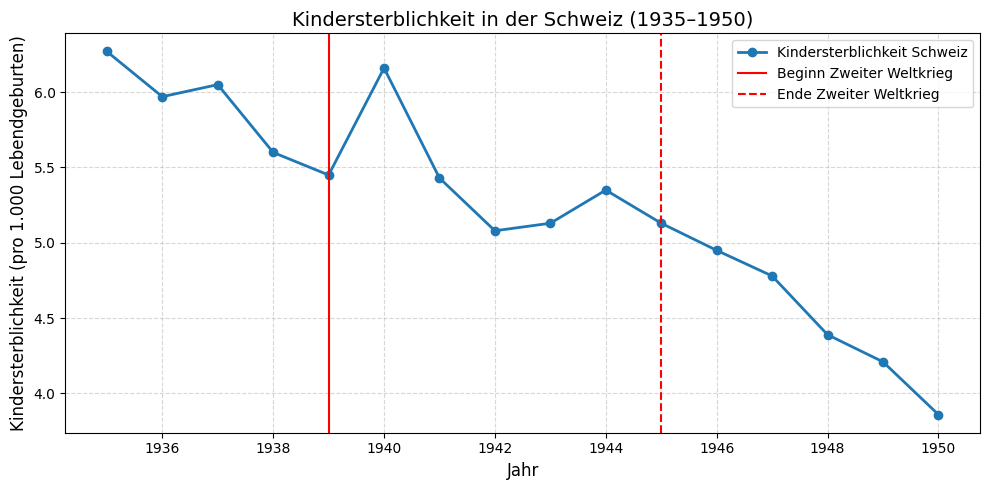

In [53]:
# Plot
plt.figure(figsize=(10, 5))

# Kindersterblichkeit mit blau (#1f77b4)
plt.plot(
    df_ch_ww2["Jahr"],
    df_ch_ww2["Kindersterblichkeit"],
    marker="o",
    color="#1f77b4",
    linewidth=2,
    label="Kindersterblichkeit Schweiz"
)

# Kriegszeit markieren
plt.axvline(1939, color="red", linestyle="-", label="Beginn Zweiter Weltkrieg")
plt.axvline(1945, color="red", linestyle="--", label="Ende Zweiter Weltkrieg")

# Achsen & Layout
plt.title("Kindersterblichkeit in der Schweiz (1935–1950)", fontsize=14)
plt.xlabel("Jahr", fontsize=12)
plt.ylabel("Kindersterblichkeit (pro 1.000 Lebendgeburten)", fontsize=12)
plt.grid(True, linestyle="--", alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()


#### Kindersterblichkeitsrate der Schweiz im zweiten Weltkrieg. 

In [54]:
# Zeitraum definieren
krieg_start = 1939
krieg_ende = 1945

# Schweiz-Daten während des Kriegs (nur mit Werten)
df_ch_krieg = df[
    (df["Land"] == "Switzerland") &
    (df["Jahr"] >= krieg_start) &
    (df["Jahr"] <= krieg_ende) &
    (df["Kindersterblichkeit"].notna())
]

# Kennzahlen berechnen
durchschnitt = df_ch_krieg["Kindersterblichkeit"].mean()
maximum = df_ch_krieg["Kindersterblichkeit"].max()
minimum = df_ch_krieg["Kindersterblichkeit"].min()

# Differenz 1945 – 1939
wert_1939 = df_ch_krieg[df_ch_krieg["Jahr"] == 1939]["Kindersterblichkeit"].values[0]
wert_1945 = df_ch_krieg[df_ch_krieg["Jahr"] == 1945]["Kindersterblichkeit"].values[0]
differenz = round(wert_1945 - wert_1939, 1)


# Ergebnis als DataFrame
vergleich_ch = pd.DataFrame({
    "Durchschnitt (1939–1945)": [durchschnitt],
    "Maximum (1939–1945)": [maximum],
    "Minimum (1939–1945)": [minimum],
    "Differenz 1945–1939": [differenz]
}, index=["Switzerland"])

# Ausgabe
pd.set_option("display.precision", 1)
print("Analyse: Kindersterblichkeit in der Schweiz (1939–1945):")
display(vergleich_ch)


Analyse: Kindersterblichkeit in der Schweiz (1939–1945):


,Durchschnitt (1939–1945),Maximum (1939–1945),Minimum (1939–1945),Differenz 1945–1939
Switzerland,5.4,6.2,5.1,-0.3


4.4.2 Gegenüberstellung der Kindersterblichkeit und Geburtenrate

In [55]:
# Alle Jahre mit Kindersterblichkeitsdaten für die Schweiz
jahre_sterbe = df[
    (df["Land"] == "Switzerland") & 
    (df["Kindersterblichkeit"].notna())
]["Jahr"].unique()

# Alle Jahre mit Geburtenraten für die Schweiz
jahre_geburt = fertil[
    (fertil["Land"] == "Switzerland") & 
    (fertil["Geburtenrate"].notna())
]["Jahr"].unique()

# Schnittmenge berechnen: Jahre mit Daten in beiden Datensätzen
gemeinsame_jahre = sorted(set(jahre_sterbe) & set(jahre_geburt))

# Ergebnis anzeigen
print(f"Gemeinsame Jahre mit Daten für die Schweiz: {gemeinsame_jahre[0]} bis {gemeinsame_jahre[-1]}")
print(f"Anzahl gemeinsamer Jahre: {len(gemeinsame_jahre)}")


Gemeinsame Jahre mit Daten für die Schweiz: 1932 bis 2023
Anzahl gemeinsamer Jahre: 92


In [56]:
# Kombinierte Daten: Schweiz
df_schweiz_combined = pd.merge(
    df[df["Land"] == "Switzerland"][["Jahr", "Kindersterblichkeit"]],
    fertil[fertil["Land"] == "Switzerland"][["Jahr", "Geburtenrate"]],
    on="Jahr"
)

### Vergleich Schweiz: Kindersterblichkeit (in %) und Geburtenrate auf gemeinsamer Skala

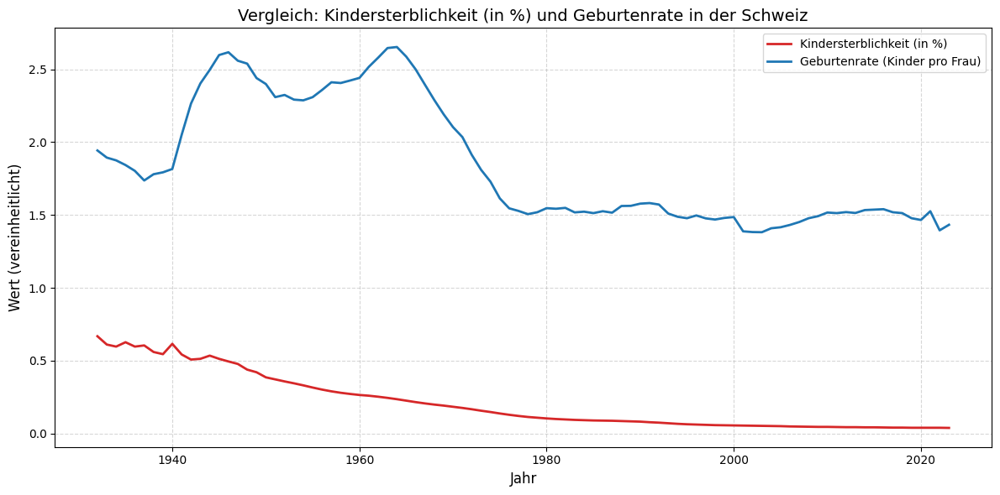

In [57]:
# 1. Kindersterblichkeit von pro 1.000 auf Prozent umrechnen
df_schweiz_combined["Kindersterblichkeit_%"] = df_schweiz_combined["Kindersterblichkeit"] / 10

# 2. Plot erstellen
plt.figure(figsize=(12, 6))

# Linie 1: Kindersterblichkeit (in %)
plt.plot(
    df_schweiz_combined["Jahr"],
    df_schweiz_combined["Kindersterblichkeit_%"],
    label="Kindersterblichkeit (in %)",
    color="#d62728",
    linewidth=2
)

# Linie 2: Geburtenrate
plt.plot(
    df_schweiz_combined["Jahr"],
    df_schweiz_combined["Geburtenrate"],
    label="Geburtenrate (Kinder pro Frau)",
    color="#1f77b4",
    linewidth=2
)

# 3. Layout und Stil
plt.title("Vergleich: Kindersterblichkeit (in %) und Geburtenrate in der Schweiz", fontsize=14)
plt.xlabel("Jahr", fontsize=12)
plt.ylabel("Wert (vereinheitlicht)", fontsize=12)
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


#### Das Liniendiagramm vergleicht die Kindersterblichkeitsrate und Geburtenrate der Schweiz.

In [58]:
# Daten für die Schweiz: 1932–2023
df_schweiz_anim = df_schweiz_combined[
    (df_schweiz_combined["Jahr"] >= 1932) &
    (df_schweiz_combined["Jahr"] <= 2023)
].copy()

In [59]:
fig = px.scatter(
    df_schweiz_anim,
    x="Geburtenrate",
    y="Kindersterblichkeit",
    animation_frame="Jahr",
    color_discrete_sequence=["#1f77b4"],
    title="Animation: Geburtenrate vs. Kindersterblichkeit in der Schweiz (1932–2023)",
    labels={
        "Geburtenrate": "Geburtenrate (Kinder pro Frau)",
        "Kindersterblichkeit": "Kindersterblichkeit (pro 1.000)"
    },
    range_x=[1, 3],
    range_y=[-1, 7],
    height=500,
    width=800
)

# Verlaufslinie hinzufügen
fig.add_scatter(
    x=df_schweiz_anim["Geburtenrate"],
    y=df_schweiz_anim["Kindersterblichkeit"],
    mode="lines",
    line=dict(color="lightgrey", width=2),
    name="Verlauf Schweiz",
    hoverinfo="skip",
    showlegend=False
)

# Layout anpassen
fig.update_traces(marker=dict(size=18, line=dict(width=1, color='black')))
fig.update_layout(
    font=dict(size=12),
    plot_bgcolor="white",
    margin=dict(t=60, b=60)
)
fig.update_yaxes(showgrid=True, gridcolor='lightgrey')
fig.update_xaxes(showgrid=True, gridcolor='lightgrey')

fig.show()


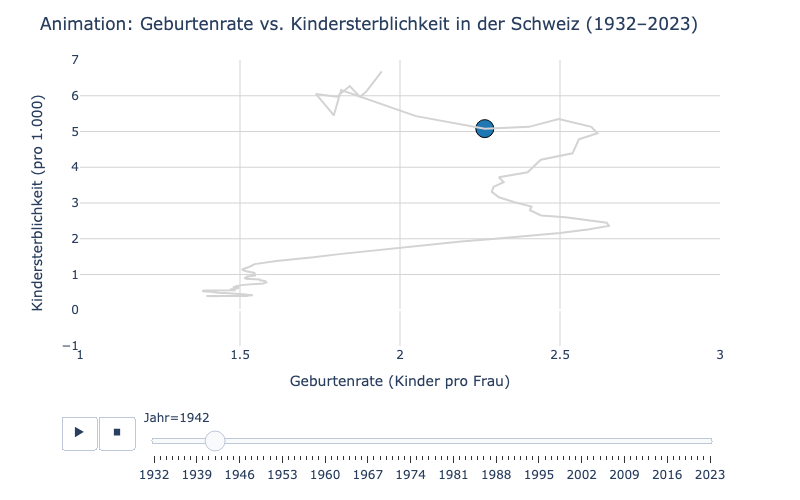

#### Die animierte Grafik zeigt den Verlauf der Kindersterblichkeit in Korrelation zur Geburtenrate pro Frau in der Schweiz. 

### Interpretation: Geburtenrate und Kindersterblichkeit in der Schweiz (1932–2023)

Die animierte Darstellung zeigt die Entwicklung der Schweiz im zweidimensionalen Raum von **Geburtenrate (x-Achse)** und **Kindersterblichkeit (y-Achse)**. Jeder Punkt steht für ein Jahr. Die Verlaufslinie zeichnet den Pfad von 1932 bis 2023 nach.

Ein klarer Trend ist erkennbar: Mit dem **kontinuierlichen Rückgang der Geburtenrate** sank auch die **Kindersterblichkeitsrate** deutlich. In den 1930er- und 1940er-Jahren lagen beide Werte noch hoch; ab den 1950er-Jahren setzte eine starke Verbesserung ein. Die Kindersterblichkeit fiel auf ein sehr niedriges Niveau, während sich die Geburtenrate nach einem Rückgang stabilisierte.

Die Darstellung zeigt keine plötzlichen Sprünge, sondern einen **gleichmäßigen, stetigen Wandel**, was typisch ist für ein hochentwickeltes Land mit stabiler Infrastruktur, medizinischer Versorgung und sozialen Standards.

Besonders auffällig ist der rasche Fortschritt in der Nachkriegszeit (ca. 1950–1975), in der die Sterblichkeit stark sank – begleitet von rückläufigen Geburtenraten, ein Muster, das für den sogenannten demografischen Übergang typisch ist.


## <span style="color:gold;">Zum Abschluss ein Countdown der beide Datensätze vereint</span>


In [60]:
import plotly.graph_objects as go
import numpy as np

# Zeitachse
years = np.arange(1950, 2024)
steps = len(years)

ENTITY = "World"

# Beispielwerte (global, plausibel)
fert_start, fert_end = 5.0, 2.3        # Kinder pro Frau
mort_start, mort_end = 180, 35          # Todesfälle / 1 000 Geburten

fert_vals = np.linspace(fert_start, fert_end, steps)
mort_vals = np.linspace(mort_start, mort_end, steps)

# Frames
frames = []
for y, f, m in zip(years, fert_vals, mort_vals):
    frames.append(
        go.Frame(
            data=[
                # Geburtenrate
                go.Scatter(
                    text=[f"<b>{f:.2f}</b><br><span style='font-size:18px'>Kinder pro Frau</span>"]
                ),
                # Kindersterblichkeit
                go.Scatter(
                    text=[f"<b>{m:.0f}</b><br><span style='font-size:18px'>Todesfälle / 1 000 Geburten</span>"]
                ),
                # Jahr (nur Jahr ändert sich)
                go.Scatter(
                    text=[f"{y}"]
                )
            ],
            traces=[1, 2, 3]
        )
    )

# Figure
fig = go.Figure(
    data=[
        # 0 — STATISCHER Schriftzug "World"
        go.Scatter(
            x=[0.5], y=[0.82],
            mode="text",
            text=[f"<b>{ENTITY}</b>"],
            textfont=dict(size=32, color="gray"),
            hoverinfo="skip"
        ),
        # 1 — Geburtenrate (links)
        go.Scatter(
            x=[0.25], y=[0.45],
            mode="text",
            text=[f"<b>{fert_start:.2f}</b><br><span style='font-size:18px'>Kinder pro Frau</span>"],
            textfont=dict(size=48, color="gold"),
            hoverinfo="skip"
        ),
        # 2 — Kindersterblichkeit (rechts)
        go.Scatter(
            x=[0.75], y=[0.45],
            mode="text",
            text=[f"<b>{mort_start}</b><br><span style='font-size:18px'>Todesfälle / 1 000 Geburten</span>"],
            textfont=dict(size=48, color="white"),
            hoverinfo="skip"
        ),
        # 3 — Jahr (zentral, animiert)
        go.Scatter(
            x=[0.5], y=[0.72],
            mode="text",
            text=["1950"],
            textfont=dict(size=30, color="lightgray"),
            hoverinfo="skip"
        )
    ],
    frames=frames
)

# Layout
fig.update_layout(
    xaxis=dict(visible=False, range=[0, 1]),
    yaxis=dict(visible=False, range=[0, 1]),
    plot_bgcolor="black",
    height=520,
    width=900,
    margin=dict(l=40, r=40, t=40, b=40),
    updatemenus=[
        dict(
            type="buttons",
            showactive=False,
            buttons=[
                dict(
                    label="▶",
                    method="animate",
                    args=[
                        None,
                        dict(
                            frame=dict(duration=80),
                            transition=dict(duration=0),
                            fromcurrent=True
                        )
                    ]
                )
            ]
        )
    ]
)

fig.show()


## <span style="color:silver;">zum Weihnachtsgruss weiter scrollen</span>

Nur ersichtlich im Jupyter Notebook, da die Animation nicht auf Github angezeigt wird. Gehört auch nicht offziell zum Leistungsnachweis


In [61]:
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

# -------------------
# Setup
# -------------------
fig, ax = plt.subplots(figsize=(5, 6))
fig.patch.set_facecolor("black")
ax.set_facecolor("black")

ax.set_xlim(-1.6, 1.6)
ax.set_ylim(-0.3, 1.9)
ax.axis("off")

green = "#1a781a"
rng = np.random.default_rng(2)

# -------------------
# Baum
# -------------------
levels = [
    (1.45, 0.55),
    (1.10, 0.80),
    (0.70, 1.05),
]

for y0, w in levels:
    ax.fill(
        [-w, 0, w],
        [y0 - 0.50, y0 + 0.15, y0 - 0.50],
        color=green, alpha=0.95, zorder=1
    )

ax.add_patch(
    plt.Rectangle((-0.15, -0.05), 0.30, 0.40,
                  color=green, alpha=0.95, zorder=1)
)

# -------------------
# Lichter
# -------------------
light_x, light_y = [], []
for i, (y0, w) in enumerate(levels):
    n = 10 + i * 2
    xs = np.linspace(-w * 0.85, w * 0.85, n)
    ys = y0 - 0.25 + 0.05 * np.sin(np.linspace(0, 2*np.pi, n))
    light_x.extend(xs)
    light_y.extend(ys)

lights = ax.scatter(
    light_x, light_y,
    s=28, color="gold", alpha=0.3, zorder=4
)

# -------------------
# Kugeln
# -------------------

# Dreiecke exakt wie gezeichnet
triangles = [
    np.array([[-0.55, 0.95], [0.0, 1.60], [0.55, 0.95]]),   # oben
    np.array([[-0.80, 0.60], [0.0, 1.25], [0.80, 0.60]]),   # mitte
    np.array([[-1.05, 0.20], [0.0, 0.85], [1.05, 0.20]])    # unten
]

def point_in_triangle(p, tri):
    """Baryzentrischer Punkt-in-Dreieck-Test"""
    a, b, c = tri
    v0 = c - a
    v1 = b - a
    v2 = p - a

    dot00 = np.dot(v0, v0)
    dot01 = np.dot(v0, v1)
    dot02 = np.dot(v0, v2)
    dot11 = np.dot(v1, v1)
    dot12 = np.dot(v1, v2)

    inv = 1 / (dot00 * dot11 - dot01 * dot01)
    u = (dot11 * dot02 - dot01 * dot12) * inv
    v = (dot00 * dot12 - dot01 * dot02) * inv

    return (u >= 0) and (v >= 0) and (u + v <= 1)


def generate_ornaments(n=22, min_dist=0.16):
    xs, ys = [], []
    attempts = 0

    while len(xs) < n and attempts < 8000:
        attempts += 1

        # zufälliger Punkt im gesamten Baum-Bereich
        x = rng.uniform(-1.1, 1.1)
        y = rng.uniform(0.2, 1.6)

        p = np.array([x, y])

        # Punkt muss in mindestens einem Dreieck liegen
        if not any(point_in_triangle(p, tri) for tri in triangles):
            continue

        # Mindestabstand
        if all((x - xi)**2 + (y - yi)**2 >= min_dist**2
               for xi, yi in zip(xs, ys)):
            xs.append(x)
            ys.append(y)

    return xs, ys


# Anzahl Kugeln
orn_x, orn_y = generate_ornaments(n=19)

ornaments = ax.scatter(
    orn_x,
    orn_y,
    s=150,
    color="crimson",
    zorder=3
)



# -------------------
# Text
# -------------------
title = ax.text(
    0.0, 1.75,
    "Merry Christmas",
    color="white",
    fontsize=18,
    ha="center",
    va="center",
    fontweight="bold",
    zorder=5
)

# -------------------
# Animation
# -------------------
def update(frame):
    alpha = 0.25 + 0.75 * (
        0.5 + 0.5 * np.sin(frame * 0.25 + np.arange(len(light_x)))
    )
    lights.set_alpha(alpha)
    return [lights, ornaments, title]

anim = FuncAnimation(fig, update, frames=240, interval=50, blit=True)
html = HTML(anim.to_jshtml())
plt.close(fig)
html

